# Microscopic Image Classifier

*Myra Paz Masinas, Eric Sunghoon Minn, Mojdeh Sayari Nejad & Fazeh Mirza Ghafour*

The dataset was collected from <font color = blue>__University of Toronto - Boone Lab of the Donnelly Centre for Cellular and Biomolecular Research__</font>. Studies have been published with this dataset and hence, dataset became available and was provided for this project. 
<br>  
Our goal of this project is to create an __Image Classifier__ to distinguish between 3 different sets of microscopic images including:<br>
1. Good Image
2. Empty Image
3. Blurred Image
<br>  

Because our set of _Blurred Images_ contain images that are restorable, our second objective of this project is to build a clustering model differentiating between Blurred Images that are restorable vs. not restorable and recover restorable images through an __Image Processing__ algorithm. 

We used **CellProfiler**, an open-source image analysis software to extract the following features and measurements:<br>
1. Intensity
2. Granularity
3. Texture
4. Quality
5. Colocalization
<br>

Initially, we extracted approximately 200 features.<br>
After filtering out some unnecessary metadata, we finalized with **149 features**.

***

## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Setting up the dataset 1.0

In [2]:
good_df = pd.read_csv('good_features.csv')
empty_df = pd.read_csv('empty_features.csv')
blurred_df = pd.read_csv('blurred_features.csv')

In [3]:
good_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104 entries, 0 to 103
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(6), object(1)
memory usage: 122.0+ KB


In [4]:
empty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(6), object(1)
memory usage: 71.6+ KB


In [5]:
blurred_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(6), object(1)
memory usage: 150.1+ KB


In [6]:
df = good_df.append([empty_df, blurred_df])

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(6), object(1)
memory usage: 345.6+ KB


In [8]:
df.head()

,Correlation_Correlation_GFP_RFP,Correlation_Costes_GFP_RFP,Correlation_Costes_RFP_GFP,Correlation_K_GFP_RFP,Correlation_K_RFP_GFP,Correlation_Manders_GFP_RFP,Correlation_Manders_RFP_GFP,Correlation_Overlap_GFP_RFP,Correlation_RWC_GFP_RFP,Correlation_RWC_RFP_GFP,...,Texture_SumEntropy_GFP_3_03,Texture_SumVariance_GFP_3_00,Texture_SumVariance_GFP_3_01,Texture_SumVariance_GFP_3_02,Texture_SumVariance_GFP_3_03,Texture_Variance_GFP_3_00,Texture_Variance_GFP_3_01,Texture_Variance_GFP_3_02,Texture_Variance_GFP_3_03,Label
0,0.689014,0.486421,0.928987,0.234393,3.56636,0.970697,0.326994,0.914291,0.680009,0.252477,...,2.564881,267.299553,258.649923,267.838784,258.363289,69.625534,69.813007,69.665716,69.813000,good
1,0.724728,0.819296,0.701009,0.303838,3.24717,0.095060,0.981695,0.993284,0.036298,0.379190,...,2.084839,113.796905,110.186512,114.159037,109.640683,29.639713,29.615351,29.628656,29.615351,good
2,0.686353,0.583214,0.951632,0.291211,2.88290,0.982935,0.284677,0.916261,0.762936,0.237745,...,2.722031,283.216739,273.245035,282.548196,273.151496,73.587256,73.639634,73.521544,73.639637,good
3,0.696790,0.836415,0.999998,0.363321,2.31991,0.997758,0.293390,0.918080,0.822959,0.245522,...,3.025118,422.202192,407.111986,421.287084,406.768747,109.758250,109.522998,109.375930,109.523042,good
4,0.922916,0.447263,0.923214,0.316074,3.15372,0.996735,0.969746,0.998403,0.973998,0.947769,...,1.711522,38.498813,37.492614,38.778338,37.934875,9.948300,9.975437,9.955333,9.975415,good


In [9]:
df.tail()

,Correlation_Correlation_GFP_RFP,Correlation_Costes_GFP_RFP,Correlation_Costes_RFP_GFP,Correlation_K_GFP_RFP,Correlation_K_RFP_GFP,Correlation_Manders_GFP_RFP,Correlation_Manders_RFP_GFP,Correlation_Overlap_GFP_RFP,Correlation_RWC_GFP_RFP,Correlation_RWC_RFP_GFP,...,Texture_SumEntropy_GFP_3_03,Texture_SumVariance_GFP_3_00,Texture_SumVariance_GFP_3_01,Texture_SumVariance_GFP_3_02,Texture_SumVariance_GFP_3_03,Texture_Variance_GFP_3_00,Texture_Variance_GFP_3_01,Texture_Variance_GFP_3_02,Texture_Variance_GFP_3_03,Label
123,0.889187,0.926998,0.853755,0.348890,2.48430,0.968712,0.969683,0.930992,0.774363,0.815875,...,3.891593,1356.570464,1324.640319,1364.208590,1344.298066,349.084171,348.649037,348.031818,348.648997,blurred
124,0.854432,0.943208,0.999999,0.270994,3.19876,0.963207,0.865955,0.931044,0.742926,0.708622,...,5.707963,1607.185321,1576.899861,1613.248338,1584.926375,411.264495,411.268287,411.072977,411.265753,blurred
125,0.882782,0.971342,0.999983,0.279491,3.12687,0.977163,0.876311,0.934843,0.749503,0.713253,...,4.450477,1292.636617,1270.171373,1294.012027,1276.459872,329.347710,328.827117,328.560548,328.826932,blurred
126,0.850567,0.948980,0.999995,0.229829,3.67565,0.938550,0.891413,0.919114,0.697049,0.713727,...,5.246299,1738.939738,1711.391208,1743.766028,1716.270105,443.919318,444.014510,443.453243,444.012589,blurred
127,0.820743,0.954102,0.999996,0.183898,4.73682,0.728139,0.945451,0.933324,0.495431,0.693065,...,6.518385,1938.752120,1895.370292,1947.801297,1906.491786,498.574881,498.741136,498.405567,498.740079,blurred


**Let's change the 'Label' to int values.**
<br>

- **Empty**: 0<br>
- **Good**: 1<br>
- **Blurred**: 2


In [10]:
df['Label'].describe()

count         293
unique          3
top       blurred
freq          128
Name: Label, dtype: object

In [12]:
df.Label.unique()

array(['good', 'empty', 'blurred'], dtype=object)

In [13]:
df['Label'] = df['Label'].map({'empty':0, 'good':1, 'blurred':2})

In [15]:
df.Label.unique()

array([1, 0, 2], dtype=int64)

In [16]:
df['Label'].value_counts()

2    128
1    104
0     61
Name: Label, dtype: int64

Text(0.5, 1.0, 'Label Counts')

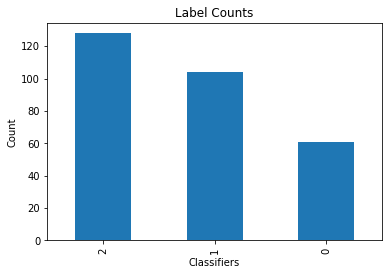

In [17]:
df['Label'].value_counts().plot(kind = 'bar')
plt.xlabel('Classifiers')
plt.ylabel('Count')
plt.title('Label Counts')

From what we're seeing from the graph above, we have an unbalanced dataset.<br>  
We have __61 Empty Images, 104 Good Images and 128 Blurred Images__.

In [18]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(7)
memory usage: 345.6 KB


In [19]:
#Full list of all 150 columns

for col in df.columns:
    print(col)

Correlation_Correlation_GFP_RFP
Correlation_Costes_GFP_RFP
Correlation_Costes_RFP_GFP
Correlation_K_GFP_RFP
Correlation_K_RFP_GFP
Correlation_Manders_GFP_RFP
Correlation_Manders_RFP_GFP
Correlation_Overlap_GFP_RFP
Correlation_RWC_GFP_RFP
Correlation_RWC_RFP_GFP
Correlation_Slope_GFP_RFP
Granularity_10_GFP
Granularity_10_RFP
Granularity_11_GFP
Granularity_11_RFP
Granularity_12_GFP
Granularity_12_RFP
Granularity_13_GFP
Granularity_13_RFP
Granularity_14_GFP
Granularity_14_RFP
Granularity_15_GFP
Granularity_15_RFP
Granularity_16_GFP
Granularity_16_RFP
Granularity_1_GFP
Granularity_1_RFP
Granularity_2_GFP
Granularity_2_RFP
Granularity_3_GFP
Granularity_3_RFP
Granularity_4_GFP
Granularity_4_RFP
Granularity_5_GFP
Granularity_5_RFP
Granularity_6_GFP
Granularity_6_RFP
Granularity_7_GFP
Granularity_7_RFP
Granularity_8_GFP
Granularity_8_RFP
Granularity_9_GFP
Granularity_9_RFP
ImageQuality_Correlation_GFP_20
ImageQuality_Correlation_RFP_20
ImageQuality_FocusScore_GFP
ImageQuality_FocusScore_RFP
Im

Initial look at the dataset indicates that we have 150 columns.<br>  
We can also see that data types are all either __float64__ or __int64__.<br>  
Since we would not have to convert any categorical variables, let's take a look deeper at the __feature variables__.

## Exploratory Analysis 2.0

In [20]:
df.isnull().mean()

Correlation_Correlation_GFP_RFP             0.000000
Correlation_Costes_GFP_RFP                  0.013652
Correlation_Costes_RFP_GFP                  0.000000
Correlation_K_GFP_RFP                       0.003413
Correlation_K_RFP_GFP                       0.003413
Correlation_Manders_GFP_RFP                 0.000000
Correlation_Manders_RFP_GFP                 0.000000
Correlation_Overlap_GFP_RFP                 0.003413
Correlation_RWC_GFP_RFP                     0.000000
Correlation_RWC_RFP_GFP                     0.000000
Correlation_Slope_GFP_RFP                   0.000000
Granularity_10_GFP                          0.000000
Granularity_10_RFP                          0.000000
Granularity_11_GFP                          0.000000
Granularity_11_RFP                          0.000000
Granularity_12_GFP                          0.000000
Granularity_12_RFP                          0.000000
Granularity_13_GFP                          0.000000
Granularity_13_RFP                          0.

In [21]:
df[df.columns[df.isnull().mean() < 0.8]]

,Correlation_Correlation_GFP_RFP,Correlation_Costes_GFP_RFP,Correlation_Costes_RFP_GFP,Correlation_K_GFP_RFP,Correlation_K_RFP_GFP,Correlation_Manders_GFP_RFP,Correlation_Manders_RFP_GFP,Correlation_Overlap_GFP_RFP,Correlation_RWC_GFP_RFP,Correlation_RWC_RFP_GFP,...,Texture_SumEntropy_GFP_3_03,Texture_SumVariance_GFP_3_00,Texture_SumVariance_GFP_3_01,Texture_SumVariance_GFP_3_02,Texture_SumVariance_GFP_3_03,Texture_Variance_GFP_3_00,Texture_Variance_GFP_3_01,Texture_Variance_GFP_3_02,Texture_Variance_GFP_3_03,Label
0,0.689014,0.486421,0.928987,0.234393,3.56636,0.970697,0.326994,0.914291,0.680009,0.252477,...,2.564881,267.299553,258.649923,267.838784,258.363289,69.625534,69.813007,69.665716,69.813000,1
1,0.724728,0.819296,0.701009,0.303838,3.24717,0.095060,0.981695,0.993284,0.036298,0.379190,...,2.084839,113.796905,110.186512,114.159037,109.640683,29.639713,29.615351,29.628656,29.615351,1
2,0.686353,0.583214,0.951632,0.291211,2.88290,0.982935,0.284677,0.916261,0.762936,0.237745,...,2.722031,283.216739,273.245035,282.548196,273.151496,73.587256,73.639634,73.521544,73.639637,1
3,0.696790,0.836415,0.999998,0.363321,2.31991,0.997758,0.293390,0.918080,0.822959,0.245522,...,3.025118,422.202192,407.111986,421.287084,406.768747,109.758250,109.522998,109.375930,109.523042,1
4,0.922916,0.447263,0.923214,0.316074,3.15372,0.996735,0.969746,0.998403,0.973998,0.947769,...,1.711522,38.498813,37.492614,38.778338,37.934875,9.948300,9.975437,9.955333,9.975415,1
5,0.817135,0.581315,0.896940,0.323105,3.04212,0.942848,0.752926,0.991424,0.815454,0.656639,...,2.349214,15.055624,14.574583,15.028597,14.521676,3.912711,3.917855,3.915717,3.917853,1
6,0.810960,0.462796,0.722768,0.354797,2.65958,0.127200,0.997993,0.971397,0.108773,0.866575,...,5.515489,368.539080,365.894683,370.251266,366.031913,98.021596,98.009870,98.364925,98.009030,1
7,0.906580,0.425433,0.515751,0.319771,3.10379,0.991009,0.986498,0.996245,0.891277,0.890806,...,1.334364,29.989118,29.425445,30.099275,29.284300,7.729286,7.751237,7.734716,7.751238,1
8,0.829215,0.751385,0.914235,0.535199,1.64374,0.998340,0.630154,0.937938,0.777255,0.465838,...,4.909888,305.358402,298.196774,305.836434,298.627137,78.939948,78.784993,79.106319,78.785902,1
9,0.802910,0.708153,0.826237,0.380660,2.28353,0.814076,0.903930,0.932336,0.702661,0.798124,...,5.004554,377.719755,369.101952,377.051846,369.352159,98.034130,98.012166,97.905924,98.012088,1


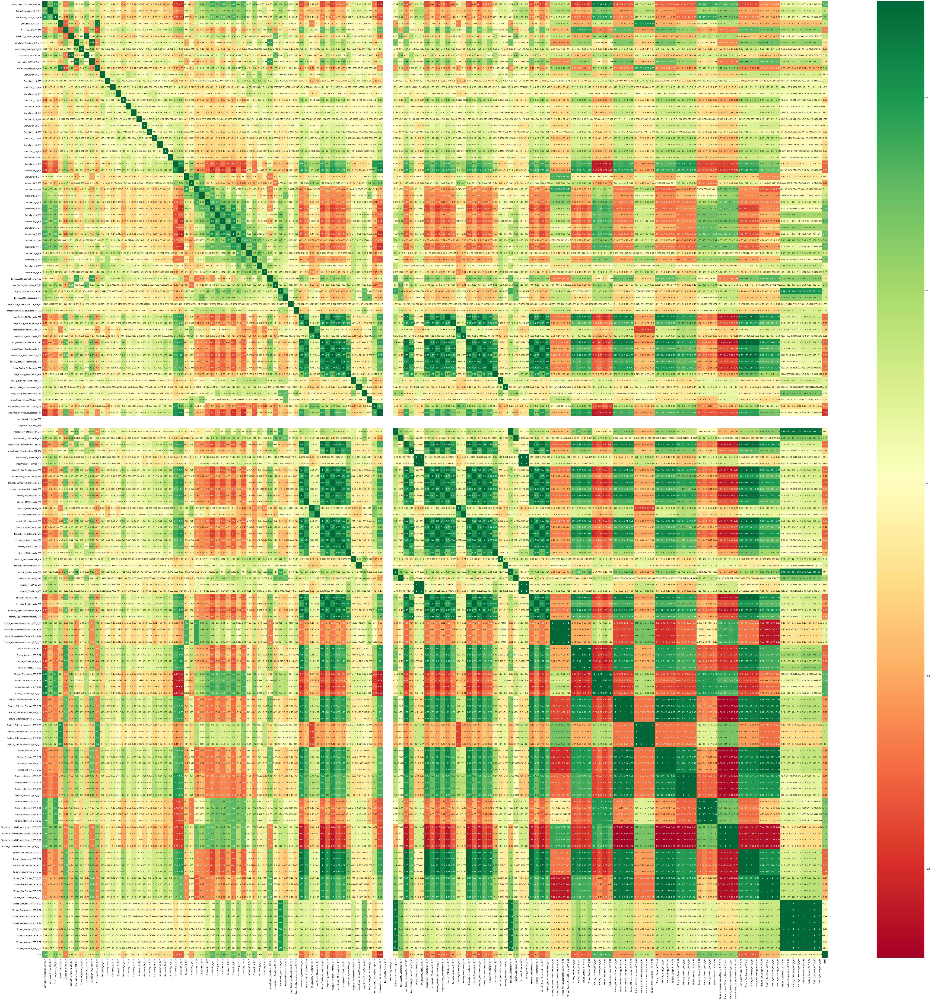

In [22]:
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize = (100, 100))
g = sns.heatmap(df[top_corr_features].corr(), annot = True, cmap = 'RdYlGn')

**Evident from what we see from the above kernels, it is merely impossible to explore the dataset as a whole.<br>**
**However, it would be feasible to explore the dataset through grouping the columns to the following subsets:<br>**
- **Correlations**
- **Granularity**
- **ImageQuality**
- **Intensity**
- **Texture**

### Correlations 2.1

In [23]:
# splicing the df into correlations df

df_correlations = df.iloc[:, 0:10]

In [24]:
df_correlations.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 10 columns):
Correlation_Correlation_GFP_RFP    293 non-null float64
Correlation_Costes_GFP_RFP         289 non-null float64
Correlation_Costes_RFP_GFP         293 non-null float64
Correlation_K_GFP_RFP              292 non-null float64
Correlation_K_RFP_GFP              292 non-null float64
Correlation_Manders_GFP_RFP        293 non-null float64
Correlation_Manders_RFP_GFP        293 non-null float64
Correlation_Overlap_GFP_RFP        292 non-null float64
Correlation_RWC_GFP_RFP            293 non-null float64
Correlation_RWC_RFP_GFP            293 non-null float64
dtypes: float64(10)
memory usage: 25.2 KB


In [25]:
df_correlations.describe()

,Correlation_Correlation_GFP_RFP,Correlation_Costes_GFP_RFP,Correlation_Costes_RFP_GFP,Correlation_K_GFP_RFP,Correlation_K_RFP_GFP,Correlation_Manders_GFP_RFP,Correlation_Manders_RFP_GFP,Correlation_Overlap_GFP_RFP,Correlation_RWC_GFP_RFP,Correlation_RWC_RFP_GFP
count,293.000000,289.000000,293.000000,292.000000,292.000000,293.000000,293.000000,292.000000,293.000000,293.000000
mean,0.730856,0.799114,0.806368,0.337852,3.213410,0.749920,0.744211,0.944052,0.591370,0.589666
std,0.220660,0.171492,0.221572,0.224896,1.335366,0.322988,0.295100,0.043387,0.279201,0.251226
min,-0.049531,0.339736,0.000000,0.100889,0.349553,0.000000,0.000000,0.665461,0.000000,0.000000
25%,0.690990,0.646897,0.706826,0.239093,2.318920,0.673885,0.526130,0.928896,0.473533,0.379190
50%,0.808496,0.829784,0.883708,0.304849,2.988010,0.914785,0.892574,0.956171,0.685605,0.678612
75%,0.870731,0.962403,0.972661,0.374897,3.787720,0.984979,0.985921,0.973077,0.803750,0.782806
max,0.996870,1.000000,1.000000,2.292560,8.106700,1.000000,1.000000,0.998403,0.973998,0.947769


In [26]:
df_correlations.isnull().describe()

,Correlation_Correlation_GFP_RFP,Correlation_Costes_GFP_RFP,Correlation_Costes_RFP_GFP,Correlation_K_GFP_RFP,Correlation_K_RFP_GFP,Correlation_Manders_GFP_RFP,Correlation_Manders_RFP_GFP,Correlation_Overlap_GFP_RFP,Correlation_RWC_GFP_RFP,Correlation_RWC_RFP_GFP
count,293,293,293,293,293,293,293,293,293,293
unique,1,2,1,2,2,1,1,2,1,1
top,False,False,False,False,False,False,False,False,False,False
freq,293,289,293,292,292,293,293,292,293,293


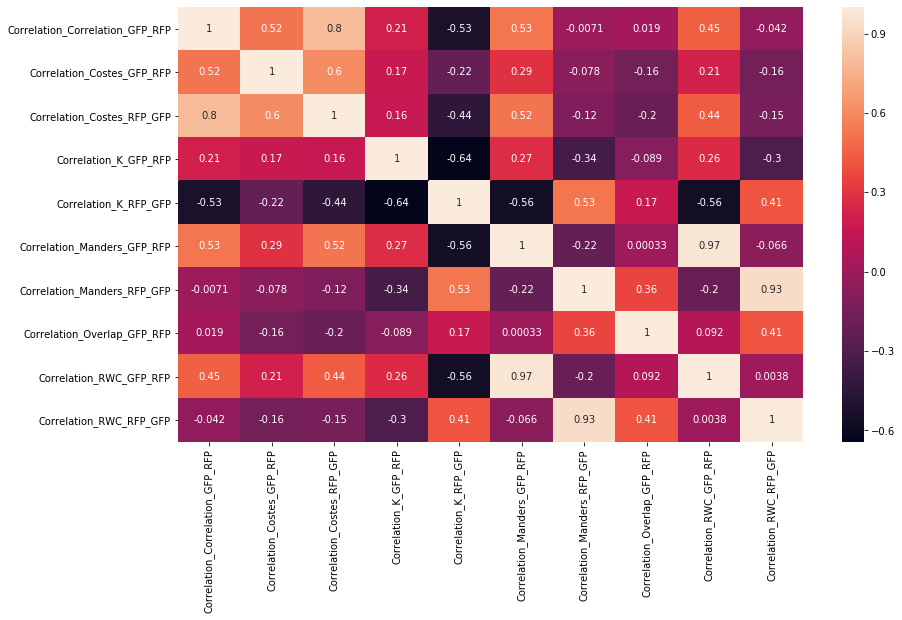

In [27]:
fig, ax = plt.subplots(figsize=(14,8))
sns.heatmap(df_correlations.corr(), annot=True)

From the heatmap, we can see clear correlations between certain variables.<br>  
For instance, correlation between `Correlation_RWC_GFP_RFP` & `Correlation_Manders_GFP_RFP` and `Correlation_Manders_RFP_GFP` & `Correlation_RWC_RFP_GFP` seem very strong.<br>  
We also see some negligible correlations between features such as `Correlation_Overlap_GFP_RFP` & `Correlation_Mandes_GFP_RFP`<br>  

Although we can definitely see that feature variables are correlated to one another, it is difficult to identify a pattern from the heatmap.

### Granularity 2.2

In [28]:
df_granularity = df.iloc[:, 11:43]

In [29]:
df_granularity.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 32 columns):
Granularity_10_GFP    293 non-null float64
Granularity_10_RFP    293 non-null float64
Granularity_11_GFP    293 non-null float64
Granularity_11_RFP    293 non-null float64
Granularity_12_GFP    293 non-null float64
Granularity_12_RFP    293 non-null float64
Granularity_13_GFP    293 non-null float64
Granularity_13_RFP    293 non-null float64
Granularity_14_GFP    293 non-null float64
Granularity_14_RFP    293 non-null float64
Granularity_15_GFP    293 non-null float64
Granularity_15_RFP    293 non-null float64
Granularity_16_GFP    293 non-null float64
Granularity_16_RFP    293 non-null float64
Granularity_1_GFP     293 non-null float64
Granularity_1_RFP     293 non-null float64
Granularity_2_GFP     293 non-null float64
Granularity_2_RFP     293 non-null float64
Granularity_3_GFP     293 non-null float64
Granularity_3_RFP     293 non-null float64
Granularity_4_GFP     293 non-null 

In [30]:
df_granularity.describe()

,Granularity_10_GFP,Granularity_10_RFP,Granularity_11_GFP,Granularity_11_RFP,Granularity_12_GFP,Granularity_12_RFP,Granularity_13_GFP,Granularity_13_RFP,Granularity_14_GFP,Granularity_14_RFP,...,Granularity_5_GFP,Granularity_5_RFP,Granularity_6_GFP,Granularity_6_RFP,Granularity_7_GFP,Granularity_7_RFP,Granularity_8_GFP,Granularity_8_RFP,Granularity_9_GFP,Granularity_9_RFP
count,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,...,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000
mean,2.164223,2.075662,1.704530,1.650656,2.067061,1.349713,1.400344,1.004976,1.292138,1.155025,...,7.139858,10.351243,7.858377,10.247846,5.135036,6.139337,3.459515,3.687350,2.377201,2.565748
std,2.642033,1.886179,2.674789,1.848625,3.506189,1.649684,2.416523,1.577574,2.478903,2.060496,...,4.907696,5.861827,5.436196,5.667701,4.094374,3.541226,3.177518,2.594130,2.443313,1.958283
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.528698,0.798358,0.216867,0.582845,0.201465,0.250717,0.000007,0.000009,0.000000,0.000000,...,3.280656,7.018374,3.569800,6.429857,2.120712,3.752222,1.240578,1.976880,0.604148,1.321947
50%,1.327496,1.685481,0.966277,1.180828,0.851085,0.834253,0.542781,0.525632,0.323887,0.341978,...,6.706464,11.498764,7.054554,12.000746,4.180110,6.436226,2.614249,3.244371,1.807962,2.157417
75%,2.918350,2.771757,2.086037,2.106042,2.193791,1.786156,1.527631,1.364548,1.300045,1.372620,...,10.085391,15.064308,11.788547,14.491969,7.502919,8.230741,4.426950,4.761325,3.045077,3.266309
max,21.890608,13.581011,29.800270,13.666022,24.159014,9.884142,18.309873,17.773648,20.500939,11.011319,...,29.636003,26.178486,23.965571,21.754153,17.778217,14.969825,16.394895,13.569438,13.664364,11.178415


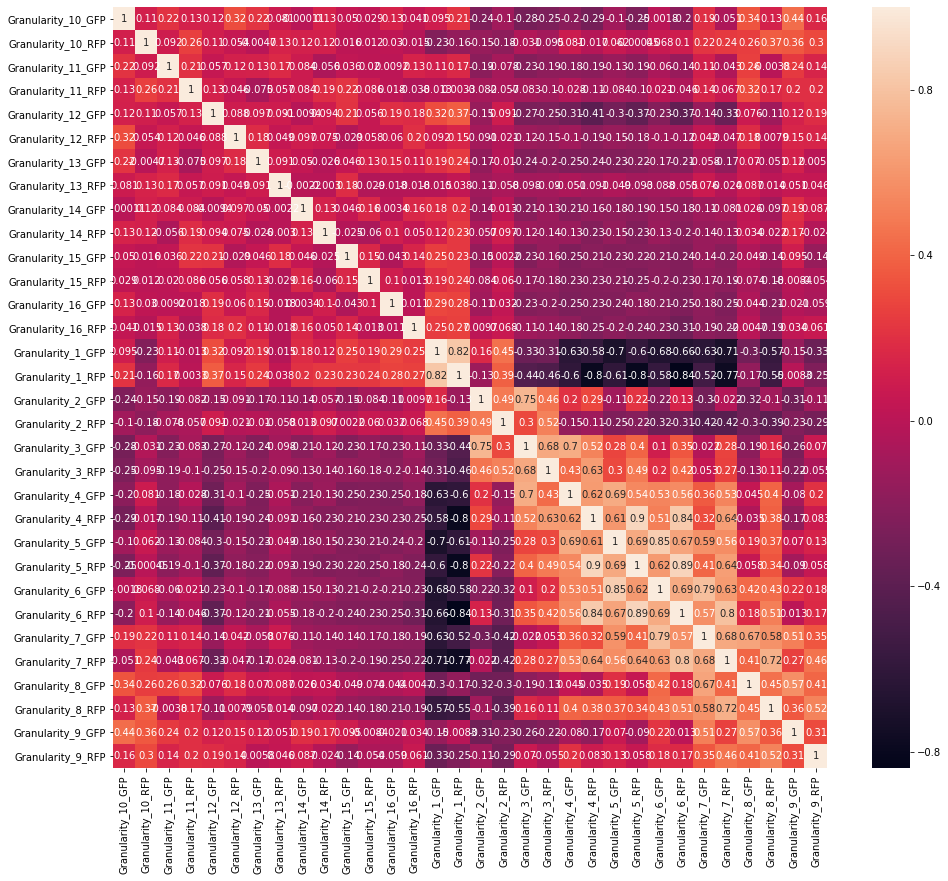

In [31]:
fig, ax = plt.subplots(figsize=(16,14))
sns.heatmap(df_granularity.corr(), annot=True)

### ImageQuality 2.3

In [32]:
df_imagequality = df.iloc[:, 44:75]

In [33]:
df_imagequality.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 31 columns):
ImageQuality_Correlation_RFP_20        293 non-null float64
ImageQuality_FocusScore_GFP            293 non-null float64
ImageQuality_FocusScore_RFP            293 non-null float64
ImageQuality_LocalFocusScore_GFP_20    293 non-null float64
ImageQuality_LocalFocusScore_RFP_20    293 non-null float64
ImageQuality_MADIntensity_GFP          293 non-null float64
ImageQuality_MADIntensity_RFP          293 non-null float64
ImageQuality_MaxIntensity_GFP          293 non-null float64
ImageQuality_MaxIntensity_RFP          293 non-null float64
ImageQuality_MeanIntensity_GFP         293 non-null float64
ImageQuality_MeanIntensity_RFP         293 non-null float64
ImageQuality_MedianIntensity_GFP       293 non-null float64
ImageQuality_MedianIntensity_RFP       293 non-null float64
ImageQuality_MinIntensity_GFP          293 non-null float64
ImageQuality_MinIntensity_RFP          293 non-null flo

In [34]:
df_imagequality.describe()

,ImageQuality_Correlation_RFP_20,ImageQuality_FocusScore_GFP,ImageQuality_FocusScore_RFP,ImageQuality_LocalFocusScore_GFP_20,ImageQuality_LocalFocusScore_RFP_20,ImageQuality_MADIntensity_GFP,ImageQuality_MADIntensity_RFP,ImageQuality_MaxIntensity_GFP,ImageQuality_MaxIntensity_RFP,ImageQuality_MeanIntensity_GFP,...,ImageQuality_Scaling_GFP,ImageQuality_Scaling_RFP,ImageQuality_StdIntensity_GFP,ImageQuality_StdIntensity_RFP,ImageQuality_ThresholdOtsu_GFP_2W,ImageQuality_ThresholdOtsu_RFP_2W,ImageQuality_TotalArea_GFP,ImageQuality_TotalArea_RFP,ImageQuality_TotalIntensity_GFP,ImageQuality_TotalIntensity_RFP
count,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,...,293.0,293.0,293.000000,293.000000,293.000000,293.000000,2.930000e+02,2.930000e+02,293.000000,293.000000
mean,0.343640,0.040440,0.010963,6.396083,0.135428,0.009513,0.002265,0.643413,0.212886,0.071018,...,255.0,255.0,0.037910,0.011905,0.080171,0.023880,1.350235e+06,1.350235e+06,95871.344915,25385.230783
std,0.155207,0.053597,0.012416,60.068927,0.299637,0.011609,0.002080,0.128694,0.042336,0.073976,...,0.0,0.0,0.022596,0.005689,0.071338,0.013478,5.042504e+03,5.042504e+03,99917.798654,17726.362587
min,-0.000332,0.001359,0.000546,0.000000,0.000000,0.000000,0.000000,0.080755,0.068714,0.004058,...,255.0,255.0,0.003546,0.002228,0.006872,0.001275,1.343342e+06,1.343342e+06,5466.500000,55.452300
25%,0.253798,0.011137,0.003575,0.002277,0.000560,0.001972,0.000833,0.655429,0.208299,0.025599,...,255.0,255.0,0.020860,0.007438,0.033654,0.016245,1.343342e+06,1.343342e+06,34388.900000,15938.500000
50%,0.383036,0.016208,0.008647,0.182079,0.053066,0.005060,0.001667,0.685480,0.215969,0.044682,...,255.0,255.0,0.032100,0.011868,0.057358,0.021775,1.353744e+06,1.353744e+06,60023.800000,22034.900000
75%,0.449756,0.045564,0.013739,0.923150,0.136867,0.009250,0.002783,0.699629,0.222213,0.071676,...,255.0,255.0,0.053537,0.015285,0.090115,0.028444,1.354396e+06,1.354396e+06,96548.100000,28110.900000
max,0.950173,0.286066,0.120609,1013.546846,2.346808,0.046554,0.009472,0.990789,0.583160,0.275092,...,255.0,255.0,0.108404,0.031628,0.276882,0.067273,1.355422e+06,1.355422e+06,372404.000000,89776.900000


In [35]:
df.drop(columns=['ImageQuality_Scaling_GFP', 'ImageQuality_Scaling_RFP'], inplace=True)

In [36]:
df_imagequality = df.iloc[:, 44:73]

In [37]:
df_imagequality.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 29 columns):
ImageQuality_Correlation_RFP_20        293 non-null float64
ImageQuality_FocusScore_GFP            293 non-null float64
ImageQuality_FocusScore_RFP            293 non-null float64
ImageQuality_LocalFocusScore_GFP_20    293 non-null float64
ImageQuality_LocalFocusScore_RFP_20    293 non-null float64
ImageQuality_MADIntensity_GFP          293 non-null float64
ImageQuality_MADIntensity_RFP          293 non-null float64
ImageQuality_MaxIntensity_GFP          293 non-null float64
ImageQuality_MaxIntensity_RFP          293 non-null float64
ImageQuality_MeanIntensity_GFP         293 non-null float64
ImageQuality_MeanIntensity_RFP         293 non-null float64
ImageQuality_MedianIntensity_GFP       293 non-null float64
ImageQuality_MedianIntensity_RFP       293 non-null float64
ImageQuality_MinIntensity_GFP          293 non-null float64
ImageQuality_MinIntensity_RFP          293 non-null flo

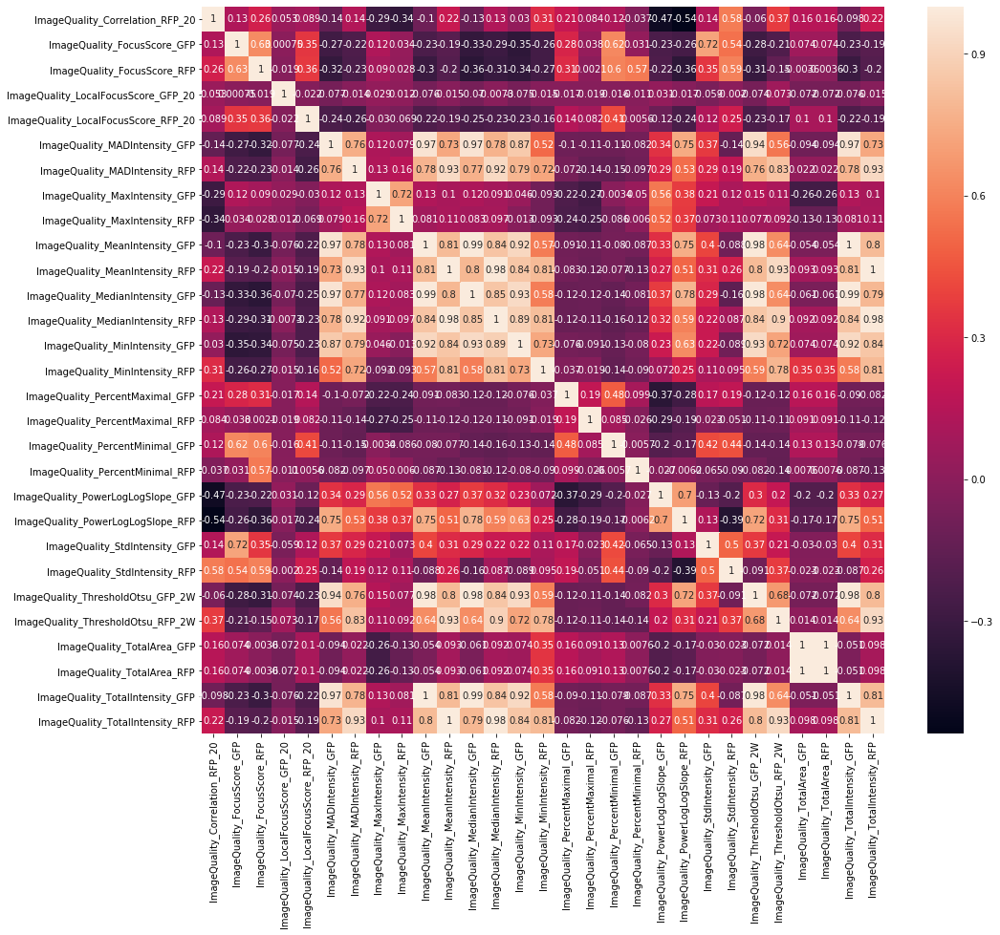

In [38]:
fig, ax = plt.subplots(figsize=(16,14))
sns.heatmap(df_imagequality.corr(), annot=True)

### Intensity 2.4

In [39]:
df_intensity = df.iloc[:, 74:95]

In [40]:
df_intensity.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 21 columns):
Intensity_LowerQuartileIntensity_RFP    293 non-null float64
Intensity_MADIntensity_GFP              293 non-null float64
Intensity_MADIntensity_RFP              293 non-null float64
Intensity_MaxIntensity_GFP              293 non-null float64
Intensity_MaxIntensity_RFP              293 non-null float64
Intensity_MeanIntensity_GFP             293 non-null float64
Intensity_MeanIntensity_RFP             293 non-null float64
Intensity_MedianIntensity_GFP           293 non-null float64
Intensity_MedianIntensity_RFP           293 non-null float64
Intensity_MinIntensity_GFP              293 non-null float64
Intensity_MinIntensity_RFP              293 non-null float64
Intensity_PercentMaximal_GFP            293 non-null float64
Intensity_PercentMaximal_RFP            293 non-null float64
Intensity_StdIntensity_GFP              293 non-null float64
Intensity_StdIntensity_RFP              2

In [41]:
df_intensity.describe()

,Intensity_LowerQuartileIntensity_RFP,Intensity_MADIntensity_GFP,Intensity_MADIntensity_RFP,Intensity_MaxIntensity_GFP,Intensity_MaxIntensity_RFP,Intensity_MeanIntensity_GFP,Intensity_MeanIntensity_RFP,Intensity_MedianIntensity_GFP,Intensity_MedianIntensity_RFP,Intensity_MinIntensity_GFP,...,Intensity_PercentMaximal_GFP,Intensity_PercentMaximal_RFP,Intensity_StdIntensity_GFP,Intensity_StdIntensity_RFP,Intensity_TotalArea_GFP,Intensity_TotalArea_RFP,Intensity_TotalIntensity_GFP,Intensity_TotalIntensity_RFP,Intensity_UpperQuartileIntensity_GFP,Intensity_UpperQuartileIntensity_RFP
count,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,...,293.000000,293.000000,293.000000,293.000000,2.930000e+02,2.930000e+02,293.000000,293.000000,293.000000,293.000000
mean,0.013316,0.009513,0.002265,0.643413,0.212886,0.071018,0.018796,0.060838,0.015345,0.015709,...,0.000081,0.000083,0.037910,0.011905,1.350235e+06,1.350235e+06,95871.344915,25385.230783,0.073330,0.018584
std,0.011536,0.011609,0.002080,0.128694,0.042336,0.073976,0.013093,0.074247,0.013255,0.021057,...,0.000034,0.000034,0.022596,0.005689,5.042504e+03,5.042504e+03,99917.798654,17726.362587,0.086997,0.015325
min,0.000000,0.000000,0.000000,0.080755,0.068714,0.004058,0.000041,0.000000,0.000000,0.000000,...,0.000074,0.000074,0.003546,0.002228,1.343342e+06,1.343342e+06,5466.500000,55.452300,0.003922,0.000000
25%,0.008333,0.001972,0.000833,0.655429,0.208299,0.025599,0.011865,0.014028,0.008333,0.000000,...,0.000074,0.000074,0.020860,0.007438,1.343342e+06,1.343342e+06,34388.900000,15938.500000,0.017361,0.010000
50%,0.010000,0.005060,0.001667,0.685480,0.215969,0.044682,0.016269,0.032259,0.011667,0.008416,...,0.000074,0.000074,0.032100,0.011868,1.353744e+06,1.353744e+06,60023.800000,22034.900000,0.039560,0.015000
75%,0.015000,0.009250,0.002783,0.699629,0.222213,0.071676,0.020926,0.062004,0.016949,0.022444,...,0.000074,0.000074,0.053537,0.015285,1.354396e+06,1.354396e+06,96548.100000,28110.900000,0.076551,0.020871
max,0.055833,0.046554,0.009472,0.990789,0.583160,0.275092,0.066318,0.264771,0.063737,0.086970,...,0.000443,0.000298,0.108404,0.031628,1.355422e+06,1.355422e+06,372404.000000,89776.900000,0.309384,0.073714


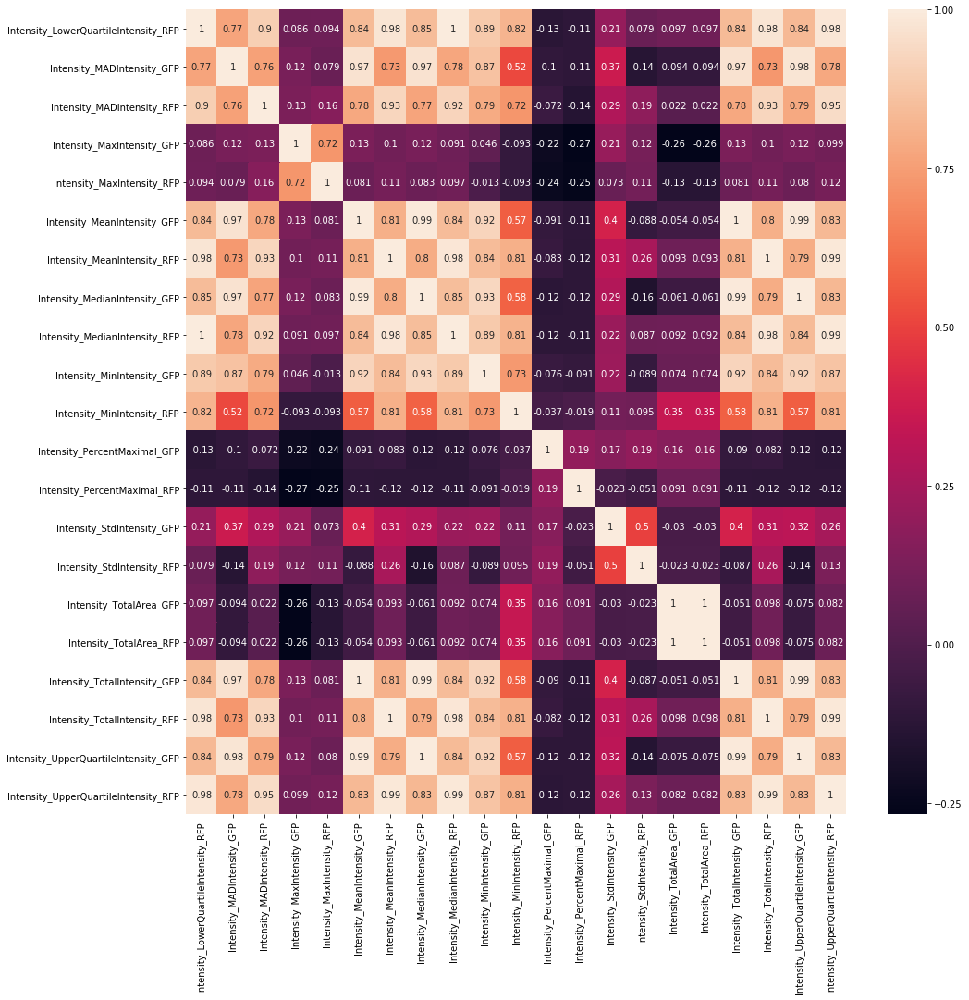

In [42]:
fig, ax = plt.subplots(figsize=(16,16))
sns.heatmap(df_intensity.corr(), annot=True)

### Texture 2.5

In [43]:
df_texture = df.iloc[:, 96:147]

In [44]:
df_texture.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 127
Data columns (total 51 columns):
Texture_AngularSecondMoment_GFP_3_01        293 non-null float64
Texture_AngularSecondMoment_GFP_3_02        293 non-null float64
Texture_AngularSecondMoment_GFP_3_03        293 non-null float64
Texture_Contrast_GFP_3_00                   293 non-null float64
Texture_Contrast_GFP_3_01                   293 non-null float64
Texture_Contrast_GFP_3_02                   293 non-null float64
Texture_Contrast_GFP_3_03                   293 non-null float64
Texture_Correlation_GFP_3_00                293 non-null float64
Texture_Correlation_GFP_3_01                293 non-null float64
Texture_Correlation_GFP_3_02                293 non-null float64
Texture_Correlation_GFP_3_03                293 non-null float64
Texture_DifferenceEntropy_GFP_3_00          293 non-null float64
Texture_DifferenceEntropy_GFP_3_01          293 non-null float64
Texture_DifferenceEntropy_GFP_3_02          293 no

In [45]:
df_texture.describe()

,Texture_AngularSecondMoment_GFP_3_01,Texture_AngularSecondMoment_GFP_3_02,Texture_AngularSecondMoment_GFP_3_03,Texture_Contrast_GFP_3_00,Texture_Contrast_GFP_3_01,Texture_Contrast_GFP_3_02,Texture_Contrast_GFP_3_03,Texture_Correlation_GFP_3_00,Texture_Correlation_GFP_3_01,Texture_Correlation_GFP_3_02,...,Texture_SumEntropy_GFP_3_02,Texture_SumEntropy_GFP_3_03,Texture_SumVariance_GFP_3_00,Texture_SumVariance_GFP_3_01,Texture_SumVariance_GFP_3_02,Texture_SumVariance_GFP_3_03,Texture_Variance_GFP_3_00,Texture_Variance_GFP_3_01,Texture_Variance_GFP_3_02,Texture_Variance_GFP_3_03
count,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,...,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000,293.000000
mean,0.179378,0.189056,0.179380,36.790896,43.518486,35.168744,42.339050,0.858967,0.822563,0.867907,...,4.018309,4.068628,470.209411,462.629151,471.318676,463.812037,126.750077,126.536909,126.621855,126.537772
std,0.221255,0.224534,0.221257,56.168863,56.434080,55.781216,56.354535,0.142644,0.136817,0.142568,...,1.645288,1.621304,556.500059,548.655626,557.745514,549.559896,143.676514,143.582070,143.671963,143.582455
min,0.000518,0.000522,0.000518,0.128449,0.218544,0.126920,0.223855,0.410920,0.394293,0.425406,...,0.017692,0.018487,3.285024,3.191610,3.279591,3.186259,0.853368,0.852538,0.851628,0.852529
25%,0.012348,0.013562,0.012358,3.781539,5.721309,3.489908,5.601575,0.842672,0.756898,0.877205,...,2.885625,2.960572,105.617148,104.679275,105.701039,104.985811,28.330430,28.379961,28.319340,28.379973
50%,0.092166,0.100982,0.092107,10.768225,16.816107,9.737847,15.696148,0.918783,0.871051,0.929735,...,4.084980,4.134349,263.540352,256.382171,265.989727,257.268764,68.902888,68.922892,68.910411,68.923786
75%,0.263077,0.281498,0.262754,33.474684,51.802340,27.221618,47.602294,0.948447,0.912679,0.954039,...,5.062517,5.115673,609.969504,599.135671,609.790078,602.871045,185.994654,185.009347,185.391440,185.014762
max,0.997858,0.997927,0.997831,219.860517,221.107009,219.364005,221.332061,0.997202,0.994959,0.997320,...,6.943642,6.939696,2987.387266,2944.762169,3003.852065,2942.632181,762.152682,763.077597,765.338871,763.077522


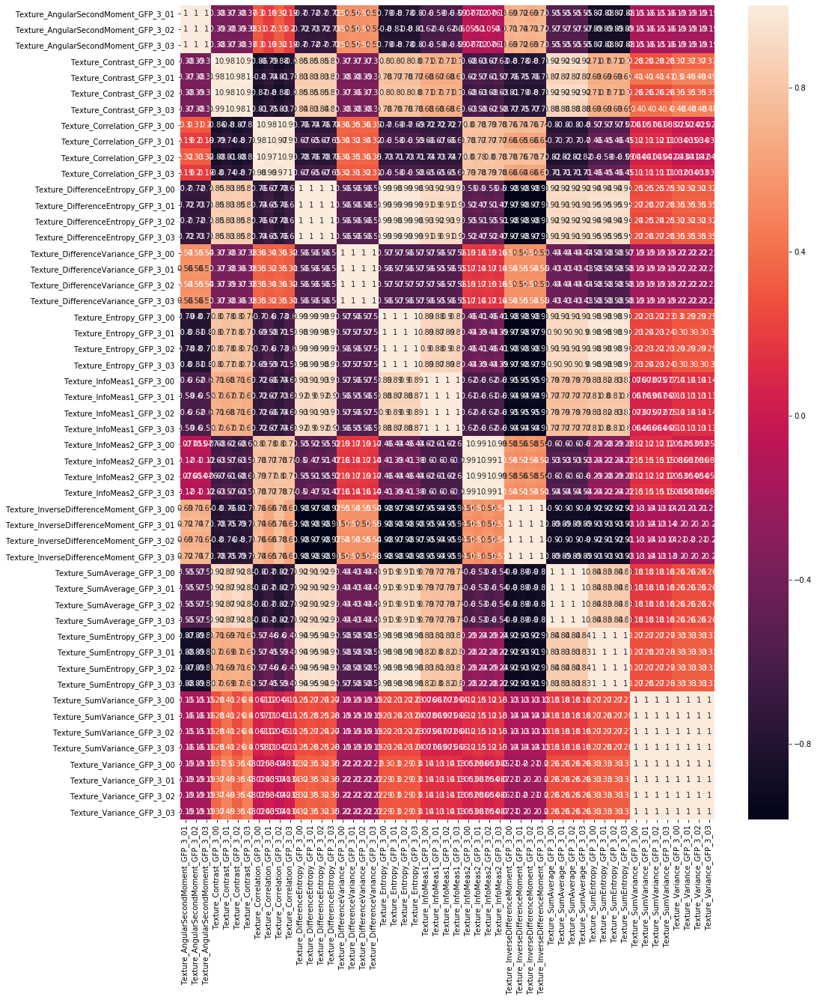

In [46]:
fig, ax = plt.subplots(figsize=(16,20))
sns.heatmap(df_texture.corr(), annot=True)

*Features* amongst the grouped subsets have some distinctive patterns of **correlations**.<br>
However, it is still very difficult to understand what these patterns of correlations truly mean without extensive **domain knowledge** of microscopic images and the extracted features.<br>  
Through our exploratory analysis, we could also see that there were some missing values - **NaN** - in the dataset.

## Testing and Training the Model 3.0

Now that we have explored through the feature variables, we will prepare the data to train our _Classifier_.<br>  
We will first split the model into _train set_ and _test set_ (70% to 30% ratio).<br>

In [47]:
from sklearn.model_selection import train_test_split

features = df.loc[:, df.columns != 'Label'].astype(float)
target = df.loc[:, df.columns == 'Label']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.3, random_state = 42, stratify = target)

print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

print(features.columns)
print(target.columns)

(205, 147)
(88, 147)
(205, 1)
(88, 1)
Index(['Correlation_Correlation_GFP_RFP', 'Correlation_Costes_GFP_RFP',
       'Correlation_Costes_RFP_GFP', 'Correlation_K_GFP_RFP',
       'Correlation_K_RFP_GFP', 'Correlation_Manders_GFP_RFP',
       'Correlation_Manders_RFP_GFP', 'Correlation_Overlap_GFP_RFP',
       'Correlation_RWC_GFP_RFP', 'Correlation_RWC_RFP_GFP',
       ...
       'Texture_SumEntropy_GFP_3_02', 'Texture_SumEntropy_GFP_3_03',
       'Texture_SumVariance_GFP_3_00', 'Texture_SumVariance_GFP_3_01',
       'Texture_SumVariance_GFP_3_02', 'Texture_SumVariance_GFP_3_03',
       'Texture_Variance_GFP_3_00', 'Texture_Variance_GFP_3_01',
       'Texture_Variance_GFP_3_02', 'Texture_Variance_GFP_3_03'],
      dtype='object', length=147)
Index(['Label'], dtype='object')


Let's check to see if we have any missing variables

In [51]:
print(np.where(np.isnan(X_train)))

print(np.where(np.isnan(y_train)))

(array([ 98, 119, 138, 153, 153, 153], dtype=int64), array([1, 1, 1, 3, 4, 7], dtype=int64))
(array([], dtype=int64), array([], dtype=int64))


In [52]:
np.any(np.isnan(X_train))

True

In [53]:
np.all(np.isfinite(X_train))

False

### SimpleImputer

Since there are some missing values - **NaN** - in our X_train dataset, we will use `SimpleImputer` from _Sklearn_ library to fill in the missing values with **median** values.

In [54]:
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median', fill_value=0)
X_train = imputer.fit_transform(X_train)
X_test = imputer.fit_transform(X_test)

In [55]:
np.any(np.isnan(X_train))

False

In [56]:
np.any(np.isnan(X_test))

False

Now there are no missing values in our dataset.

### StandardScaler

Because some of the models that we are going to try fitting such as Support Vector Machine, require features to be scaled, we are going to use `StandardScaler` from _Sklearn_ library to standardize the features by **removing the mean and scaling to unit variance**. 

In [57]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

### Feature Importance 

We are going to build a simple, default `ExtraTreesClassifier` model to see which features would have the **most impact** on the models we're going to build.

[0.         0.00778877 0.00799121 0.         0.00251936 0.
 0.00367984 0.00712191 0.00211485 0.00922439 0.         0.001551
 0.00567693 0.00299463 0.         0.00576771 0.00398652 0.00220246
 0.00417827 0.         0.00203471 0.00160729 0.00596096 0.00212089
 0.         0.00409258 0.00771007 0.00177647 0.01035519 0.01348349
 0.00127329 0.00265625 0.00191902 0.00076135 0.00222764 0.00121815
 0.00634657 0.         0.00327652 0.00284236 0.0170429  0.00228404
 0.01672848 0.00915416 0.01278146 0.00632897 0.0084911  0.
 0.         0.03181153 0.         0.01148755 0.01035315 0.0292597
 0.00036914 0.02714431 0.00230277 0.00266471 0.0002855  0.00963646
 0.00114202 0.00121815 0.00488404 0.02692338 0.0212755  0.00346766
 0.00338506 0.05236409 0.         0.02960184 0.00668852 0.00014795
 0.00190336 0.00014525 0.00439677 0.00359014 0.00101513 0.02478491
 0.00612903 0.00054382 0.00367216 0.02908483 0.01659174 0.00721897
 0.00830568 0.0143963  0.00182723 0.         0.00423704 0.03332936
 0.0519534  0.

Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
Z:\ProgramFiles\Anaconda\lib\site-packages\ipykernel_launcher.py:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  after removing the cwd from sys.path.


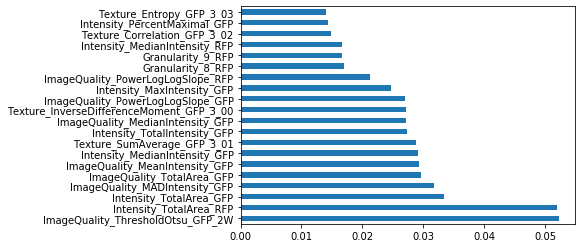

<Figure size 14400x8640 with 0 Axes>

In [59]:
from sklearn.ensemble import ExtraTreesClassifier

model = ExtraTreesClassifier()
model.fit(X_train, y_train)
print(model.feature_importances_) #use builtin class feature_importances of tree based classifiers

feat_importances = pd.Series(model.feature_importances_, index=features.columns)
feat_importances.nlargest(20).plot(kind='barh')
plt.figure(figsize=(200, 120))
plt.show()

In [60]:
feat_importances.nlargest(20)

ImageQuality_ThresholdOtsu_GFP_2W           0.052364
Intensity_TotalArea_RFP                     0.051953
Intensity_TotalArea_GFP                     0.033329
ImageQuality_MADIntensity_GFP               0.031812
ImageQuality_TotalArea_GFP                  0.029602
ImageQuality_MeanIntensity_GFP              0.029260
Intensity_MedianIntensity_GFP               0.029085
Texture_SumAverage_GFP_3_01                 0.028876
Intensity_TotalIntensity_GFP                0.027278
ImageQuality_MedianIntensity_GFP            0.027144
Texture_InverseDifferenceMoment_GFP_3_00    0.027131
ImageQuality_PowerLogLogSlope_GFP           0.026923
Intensity_MaxIntensity_GFP                  0.024785
ImageQuality_PowerLogLogSlope_RFP           0.021275
Granularity_8_RFP                           0.017043
Granularity_9_RFP                           0.016728
Intensity_MedianIntensity_RFP               0.016592
Texture_Correlation_GFP_3_02                0.014864
Intensity_PercentMaximal_GFP                0.

### Grid_Search_Fit Function

In [61]:
from sklearn.metrics import f1_score

def grid_search_fit(pipe, param_grid):
    grid = GridSearchCV(pipe,
                       param_grid=param_grid, cv=5,
                       verbose=5,
                       return_train_score=True,
                       iid=False,
                       n_jobs=-1
                       )
    grid.fit(X_train, np.ravel(y_train))
    return grid

Because we are going to be building multiple models with intensive hyperparameter tuning, we built this function to ease the process.<br>  
Now, we will try building the different models.

### One Vs Rest Classifier (SVC) - 3.1

In [62]:
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report

pipe = make_pipeline(OneVsRestClassifier(SVC(random_state = 42, probability=True)))

param_grid = [{
    'onevsrestclassifier__estimator__C': [0.001, 0.01, 0.1, 1, 10, 100],
    'onevsrestclassifier__estimator__kernel': ['linear', 'rbf', 'poly'],
    'onevsrestclassifier__estimator__degree': [2, 3, 4, 5, 7, 10],
    'onevsrestclassifier__estimator__gamma': [0.01, 0.02, 0.03, 0.04, 0.05, 1]
}]

clf = grid_search_fit(pipe, param_grid)

preds = clf.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 209 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 461 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 785 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 1181 tasks      | elapsed:   10.9s
[Parallel(n_jobs=-1)]: Done 1649 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done 2189 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 2801 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 3217 out of 3240 | elapsed:   29.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   29.1s finished


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.90      0.84      0.87        31
     blurred       0.86      0.92      0.89        39

    accuracy                           0.89        88
   macro avg       0.90      0.88      0.89        88
weighted avg       0.89      0.89      0.89        88



In [63]:
clf.best_params_

{'onevsrestclassifier__estimator__C': 10,
 'onevsrestclassifier__estimator__degree': 2,
 'onevsrestclassifier__estimator__gamma': 0.02,
 'onevsrestclassifier__estimator__kernel': 'rbf'}

In [64]:
pipe2 = make_pipeline(OneVsRestClassifier(SVC(random_state = 42, probability=True)))

param_grid2 = [{
    'onevsrestclassifier__estimator__C': [8, 9, 10, 11, 12],
    'onevsrestclassifier__estimator__kernel': ['linear', 'rbf', 'poly'],
    'onevsrestclassifier__estimator__degree': [1, 2, 3],
    'onevsrestclassifier__estimator__gamma': [0.01, 0.015, 0.02, 0.025, 0.03]
}]

clf2 = grid_search_fit(pipe2, param_grid2)

preds2 = clf2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 225 candidates, totalling 1125 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 480 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 984 tasks      | elapsed:    7.2s


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.90      0.84      0.87        31
     blurred       0.86      0.92      0.89        39

    accuracy                           0.89        88
   macro avg       0.90      0.88      0.89        88
weighted avg       0.89      0.89      0.89        88



[Parallel(n_jobs=-1)]: Done 1125 out of 1125 | elapsed:    8.2s finished


In [65]:
clf2.best_params_

{'onevsrestclassifier__estimator__C': 9,
 'onevsrestclassifier__estimator__degree': 1,
 'onevsrestclassifier__estimator__gamma': 0.015,
 'onevsrestclassifier__estimator__kernel': 'rbf'}

In [66]:
pipe3 = make_pipeline(OneVsRestClassifier(SVC(random_state = 42, probability=True)))
param_grid3 = [{
    'onevsrestclassifier__estimator__C': [8, 9, 10],
    'onevsrestclassifier__estimator__kernel': ['linear', 'rbf', 'poly'],
    'onevsrestclassifier__estimator__degree': [1, 2],
    'onevsrestclassifier__estimator__gamma': [0.01, 0.015, 0.02]
}]

clf3 = grid_search_fit(pipe3, param_grid3)

preds3 = clf3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 54 candidates, totalling 270 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 120 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 192 out of 270 | elapsed:    1.3s remaining:    0.5s


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.90      0.84      0.87        31
     blurred       0.86      0.92      0.89        39

    accuracy                           0.89        88
   macro avg       0.90      0.88      0.89        88
weighted avg       0.89      0.89      0.89        88



[Parallel(n_jobs=-1)]: Done 270 out of 270 | elapsed:    1.8s finished


In [67]:
clf3.best_params_

{'onevsrestclassifier__estimator__C': 9,
 'onevsrestclassifier__estimator__degree': 1,
 'onevsrestclassifier__estimator__gamma': 0.015,
 'onevsrestclassifier__estimator__kernel': 'rbf'}

In [68]:
clf_final = make_pipeline(OneVsRestClassifier(SVC(random_state = 42, kernel='rbf',C = 9, 
                                                  degree=1, gamma=0.015, probability=True))
                         )

clf_final.fit(X_train, np.ravel(y_train))
pred_final = clf_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.90      0.84      0.87        31
     blurred       0.86      0.92      0.89        39

    accuracy                           0.89        88
   macro avg       0.90      0.88      0.89        88
weighted avg       0.89      0.89      0.89        88



Hyperparameters for our best performing model for `OnevsRestClassifer` with `SVC` are:<br>  
1. C: 9
2. degree: 1
3. gamma: 0.015
4. kernel: 'rbf'<br>

We are going to create a list of accuracies for all models to compare at the end

In [78]:
accuracy = {}

accuracy.update({'OneVsRestClassifier':clf_final.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364}


### Random Forest Classifier -  3.2

In [79]:
from sklearn.ensemble import RandomForestClassifier

pipe_rfc = make_pipeline(RandomForestClassifier(random_state = 42, n_jobs=-1))

param_grid = [{    
    'randomforestclassifier__bootstrap': [True, False],
    'randomforestclassifier__max_depth': [2, 5, 10],
    'randomforestclassifier__max_features': [2, 3, 4, 5],
    'randomforestclassifier__min_samples_leaf': [3, 4, 5],
    'randomforestclassifier__min_samples_split': [2, 5, 10],
    'randomforestclassifier__n_estimators': [100, 500, 1000, 1500]
    
}]

rfc = grid_search_fit(pipe_rfc, param_grid)

preds = rfc.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 864 candidates, totalling 4320 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    8.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:   41.1s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  6.8min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 4320 out of 4320 | 

              precision    recall  f1-score   support

       empty       1.00      0.83      0.91        18
        good       0.88      0.94      0.91        31
     blurred       0.90      0.92      0.91        39

    accuracy                           0.91        88
   macro avg       0.93      0.90      0.91        88
weighted avg       0.91      0.91      0.91        88



In [80]:
rfc.best_params_

{'randomforestclassifier__bootstrap': True,
 'randomforestclassifier__max_depth': 10,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 3,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 100}

In [81]:
pipe_rfc = make_pipeline(RandomForestClassifier(random_state = 42, n_jobs=-1))

param_grid2 = [{    
    'randomforestclassifier__bootstrap': [False],
    'randomforestclassifier__max_depth': [9, 10, 11],
    'randomforestclassifier__max_features': [4, 5, 6],
    'randomforestclassifier__min_samples_leaf': [2, 3, 4],
    'randomforestclassifier__min_samples_split': [2, 3, 4],
    'randomforestclassifier__n_estimators': [90, 100, 110]
    
}]

rfc2 = grid_search_fit(pipe_rfc, param_grid2)

preds2 = rfc2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 243 candidates, totalling 1215 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   16.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   30.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   39.5s
[Parallel(n_jobs=-1)]: Done 1215 out of 1215 | elapsed:   42.5s finished


              precision    recall  f1-score   support

       empty       1.00      0.89      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.88      0.92      0.90        39

    accuracy                           0.91        88
   macro avg       0.93      0.91      0.91        88
weighted avg       0.91      0.91      0.91        88



In [82]:
rfc2.best_params_

{'randomforestclassifier__bootstrap': False,
 'randomforestclassifier__max_depth': 9,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 2,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 90}

In [83]:
pipe_rfc = make_pipeline(RandomForestClassifier(random_state = 42, n_jobs=-1))

param_grid3 = [{    
    'randomforestclassifier__bootstrap': [False],
    'randomforestclassifier__max_depth': [6, 7, 8, 9],
    'randomforestclassifier__max_features': [4, 5, 6],
    'randomforestclassifier__min_samples_leaf': [2, 3, 4],
    'randomforestclassifier__min_samples_split': [2, 3, 4],
    'randomforestclassifier__n_estimators': [60, 70, 80, 90]
    
}]

rfc3 = grid_search_fit(pipe_rfc, param_grid3)

preds3 = rfc3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.9s
[Parallel(n_jobs=-1)]: Done 2160 out of 2160 | elapsed:  1.1min finished


              precision    recall  f1-score   support

       empty       1.00      0.94      0.97        18
        good       0.90      0.90      0.90        31
     blurred       0.90      0.92      0.91        39

    accuracy                           0.92        88
   macro avg       0.93      0.92      0.93        88
weighted avg       0.92      0.92      0.92        88



In [84]:
rfc3.best_params_

{'randomforestclassifier__bootstrap': False,
 'randomforestclassifier__max_depth': 7,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 2,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 60}

In [85]:
rfc_final = RandomForestClassifier(random_state = 42, n_jobs = -1, bootstrap = False, max_depth = 7,
                                                max_features = 5, min_samples_leaf = 2, min_samples_split = 2,
                                                 n_estimators = 60)

rfc_final.fit(X_train, np.ravel(y_train))
pred_final = rfc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       1.00      0.94      0.97        18
        good       0.90      0.90      0.90        31
     blurred       0.90      0.92      0.91        39

    accuracy                           0.92        88
   macro avg       0.93      0.92      0.93        88
weighted avg       0.92      0.92      0.92        88



Hyperparameters for our best performing model for `RandomForestClassifier` are:<br>  
1. bootstrap: False
2. max_depth: 7
3. max_features: 5
4. min_samples_leaf: 2
5. min_samples_split: 2
6. n_estimators: 60

In [86]:
accuracy.update({'RandomForestClassifier':rfc_final.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454}


### Logistic Regression - 3.3

In [87]:
from sklearn.linear_model import LogisticRegression

pipe_lrc = make_pipeline(LogisticRegression(random_state = 42))

param_grid = [{
    'logisticregression__penalty': ['l1', 'l2'],
    'logisticregression__solver': ['liblinear'],
    'logisticregression__max_iter': [100, 1000, 5000],
    'logisticregression__C': [10, 12, 14, 16, 20]
}]

lrc = grid_search_fit(pipe_lrc, param_grid)

preds = lrc.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.83      0.81      0.82        31
     blurred       0.83      0.87      0.85        39

    accuracy                           0.85        88
   macro avg       0.87      0.86      0.86        88
weighted avg       0.85      0.85      0.85        88



[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.6s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


In [88]:
lrc.best_params_

{'logisticregression__C': 20,
 'logisticregression__max_iter': 100,
 'logisticregression__penalty': 'l1',
 'logisticregression__solver': 'liblinear'}

In [89]:
pipe_lrc = make_pipeline(LogisticRegression(random_state = 42))

param_grid = [{
    'logisticregression__penalty': ['l1', 'l2'],
    'logisticregression__solver': ['liblinear'],
    'logisticregression__max_iter': [90, 100, 110],
    'logisticregression__C': [18, 19, 20, 21, 22]
}]

lrc2 = grid_search_fit(pipe_lrc, param_grid)

preds2 = lrc2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.83      0.81      0.82        31
     blurred       0.83      0.87      0.85        39

    accuracy                           0.85        88
   macro avg       0.87      0.86      0.86        88
weighted avg       0.85      0.85      0.85        88



[Parallel(n_jobs=-1)]: Done  96 out of 150 | elapsed:    0.3s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:    0.5s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


In [90]:
lrc2.best_params_

{'logisticregression__C': 18,
 'logisticregression__max_iter': 90,
 'logisticregression__penalty': 'l1',
 'logisticregression__solver': 'liblinear'}

In [91]:
pipe_lrc = make_pipeline(LogisticRegression(random_state = 42))

param_grid = [{
    'logisticregression__penalty': ['l1', 'l2'],
    'logisticregression__solver': ['liblinear'],
    'logisticregression__max_iter': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
    'logisticregression__C': [15, 16, 17, 18, 19]
}]

lrc3 = grid_search_fit(pipe_lrc, param_grid)

preds3 = lrc3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 168 tasks      | elapsed:    0.5s


              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.83      0.81      0.82        31
     blurred       0.83      0.87      0.85        39

    accuracy                           0.85        88
   macro avg       0.87      0.86      0.86        88
weighted avg       0.85      0.85      0.85        88



[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    1.5s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


In [92]:
lrc3.best_params_

{'logisticregression__C': 17,
 'logisticregression__max_iter': 30,
 'logisticregression__penalty': 'l1',
 'logisticregression__solver': 'liblinear'}

In [93]:
lrc_final = make_pipeline(LogisticRegression(random_state=42, C = 17, max_iter = 30, penalty = 'l1', solver = 'liblinear'))

lrc_final.fit(X_train, np.ravel(y_train))
pred_final = lrc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       0.94      0.89      0.91        18
        good       0.83      0.81      0.82        31
     blurred       0.83      0.87      0.85        39

    accuracy                           0.85        88
   macro avg       0.87      0.86      0.86        88
weighted avg       0.85      0.85      0.85        88



Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Hyperparameters for our best performing model for `LogisticRegression` are:<br>  
1. C: 17
2. max_iter: 30
3. penalty: 'l1'
4. solver: 'liblinear'

In [94]:
accuracy.update({'LogisticRegression':lrc_final.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454, 'LogisticRegression': 0.8522727272727273}


### Gradient Boosting Classifier 3.4

In [95]:
from sklearn.ensemble import GradientBoostingClassifier

pipe_gbc = make_pipeline(GradientBoostingClassifier(random_state = 42))

param_grid = [{
    'gradientboostingclassifier__n_estimators': [50, 100],
    'gradientboostingclassifier__max_depth': [5, 10],
    'gradientboostingclassifier__max_features': [2, 5, 10],
    'gradientboostingclassifier__min_samples_leaf': [2, 5, 10],
    'gradientboostingclassifier__min_samples_split': [2, 5, 10]
}]

gbc = grid_search_fit(pipe_gbc, param_grid)

preds = gbc.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 108 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   13.2s


              precision    recall  f1-score   support

       empty       0.94      0.94      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.92        88
   macro avg       0.92      0.92      0.92        88
weighted avg       0.92      0.92      0.92        88



[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   16.9s finished


In [96]:
gbc.best_params_

{'gradientboostingclassifier__max_depth': 5,
 'gradientboostingclassifier__max_features': 5,
 'gradientboostingclassifier__min_samples_leaf': 2,
 'gradientboostingclassifier__min_samples_split': 2,
 'gradientboostingclassifier__n_estimators': 100}

In [97]:
pipe_gbc = make_pipeline(GradientBoostingClassifier(random_state = 42))

param_grid = [{
    'gradientboostingclassifier__n_estimators': [50, 100, 150],
    'gradientboostingclassifier__max_depth': [4, 5, 6],
    'gradientboostingclassifier__max_features': [4, 5, 6],
    'gradientboostingclassifier__min_samples_leaf': [2, 3],
    'gradientboostingclassifier__min_samples_split': [2, 3]
}]

gbc2 = grid_search_fit(pipe_gbc, param_grid)

preds2 = gbc2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 108 candidates, totalling 540 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    7.3s


              precision    recall  f1-score   support

       empty       0.94      0.94      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.92        88
   macro avg       0.92      0.92      0.92        88
weighted avg       0.92      0.92      0.92        88



[Parallel(n_jobs=-1)]: Done 540 out of 540 | elapsed:   16.6s finished


In [98]:
gbc2.best_params_

{'gradientboostingclassifier__max_depth': 5,
 'gradientboostingclassifier__max_features': 5,
 'gradientboostingclassifier__min_samples_leaf': 2,
 'gradientboostingclassifier__min_samples_split': 2,
 'gradientboostingclassifier__n_estimators': 100}

In [123]:
gbc_final = GradientBoostingClassifier(random_state=42, max_depth = 5,
                                                    max_features = 5, min_samples_leaf = 2,
                                                    min_samples_split = 2, n_estimators = 100)

gbc_final.fit(X_train, np.ravel(y_train))
pred_final = gbc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       0.94      0.94      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.92        88
   macro avg       0.92      0.92      0.92        88
weighted avg       0.92      0.92      0.92        88



Hyperparameters for our best performing model for `GradientBoostingClassifier` are:<br>  
1. max_depth: 5
2. max_features: 5
3. min_samples_leaf: 2
4. min_samples_split: 2
5. n_estimators: 100

In [100]:
accuracy.update({'GradientBoostingClassifier':gbc_final.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454, 'LogisticRegression': 0.8522727272727273, 'GradientBoostingClassifier': 0.9204545454545454}


### AdaBoostClassifier 3.5

In [101]:
from sklearn.ensemble import AdaBoostClassifier

pipe_abc = make_pipeline(AdaBoostClassifier(random_state = 42))

param_grid = [{
    'adaboostclassifier__n_estimators':[50, 100],
    'adaboostclassifier__learning_rate':[0.1, 10, 100]
}]

abc = grid_search_fit(pipe_abc, param_grid)

preds = abc.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   7 out of  30 | elapsed:    0.1s remaining:    0.7s
[Parallel(n_jobs=-1)]: Done  14 out of  30 | elapsed:    0.3s remaining:    0.4s
[Parallel(n_jobs=-1)]: Done  21 out of  30 | elapsed:    0.4s remaining:    0.1s


              precision    recall  f1-score   support

       empty       0.00      0.00      0.00        18
        good       0.91      0.94      0.92        31
     blurred       0.64      0.92      0.76        39

    accuracy                           0.74        88
   macro avg       0.52      0.62      0.56        88
weighted avg       0.60      0.74      0.66        88



[Parallel(n_jobs=-1)]: Done  28 out of  30 | elapsed:    1.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed:    1.0s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [102]:
abc.best_params_

{'adaboostclassifier__learning_rate': 0.1,
 'adaboostclassifier__n_estimators': 50}

In [103]:
from sklearn.ensemble import AdaBoostClassifier

pipe_abc = make_pipeline(AdaBoostClassifier(random_state = 42))

param_grid = [{
    'adaboostclassifier__n_estimators':[40, 50, 60],
    'adaboostclassifier__learning_rate':[0.05, 0.01, 0.015]
}]

abc2 = grid_search_fit(pipe_abc, param_grid)

preds2 = abc2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  22 out of  45 | elapsed:    0.4s remaining:    0.4s


              precision    recall  f1-score   support

       empty       0.00      0.00      0.00        18
        good       0.90      0.87      0.89        31
     blurred       0.62      0.92      0.74        39

    accuracy                           0.72        88
   macro avg       0.51      0.60      0.54        88
weighted avg       0.59      0.72      0.64        88



[Parallel(n_jobs=-1)]: Done  45 out of  45 | elapsed:    0.8s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [104]:
abc2.best_params_

{'adaboostclassifier__learning_rate': 0.05,
 'adaboostclassifier__n_estimators': 40}

In [105]:
from sklearn.ensemble import AdaBoostClassifier

pipe_abc = make_pipeline(AdaBoostClassifier(random_state = 42))

param_grid = [{
    'adaboostclassifier__n_estimators':[10, 20, 30, 40, 50],
    'adaboostclassifier__learning_rate':[0.02, 0.03, 0.04, 0.05, 0.06]
}]

abc3 = grid_search_fit(pipe_abc, param_grid)

preds3 = abc3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 25 candidates, totalling 125 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 out of 125 | elapsed:    0.3s remaining:    1.8s
[Parallel(n_jobs=-1)]: Done 102 out of 125 | elapsed:    1.5s remaining:    0.3s


              precision    recall  f1-score   support

       empty       1.00      0.67      0.80        18
        good       0.67      0.94      0.78        31
     blurred       0.76      0.64      0.69        39

    accuracy                           0.75        88
   macro avg       0.81      0.75      0.76        88
weighted avg       0.78      0.75      0.75        88



[Parallel(n_jobs=-1)]: Done 125 out of 125 | elapsed:    1.8s finished


In [106]:
abc3.best_params_

{'adaboostclassifier__learning_rate': 0.03,
 'adaboostclassifier__n_estimators': 10}

Compared to other classifiers that we've built so far, it seems like AdaBoostClassifier underperforms with our dataset.

In [108]:
accuracy.update({'AdaBoostClassifier':abc3.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454, 'LogisticRegression': 0.8522727272727273, 'GradientBoostingClassifier': 0.9204545454545454, 'AdaBoostClassifier': 0.75}


### ExtraTreesClassifier 3.6

In [109]:
pipe_etc = make_pipeline(ExtraTreesClassifier(random_state = 42))

param_grid = [{
    'extratreesclassifier__n_estimators':[10, 50],
    'extratreesclassifier__bootstrap':[True, False],
    'extratreesclassifier__max_depth':[5, 10],
    'extratreesclassifier__max_features':[2, 5, 10],
    'extratreesclassifier__min_samples_leaf':[2, 5, 10],
    'extratreesclassifier__min_samples_split':[2, 5 , 10]
}]

etc = grid_search_fit(pipe_etc, param_grid)

preds = etc.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 216 candidates, totalling 1080 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 840 out of 1080 | elapsed:    3.4s remaining:    0.9s


              precision    recall  f1-score   support

       empty       1.00      0.83      0.91        18
        good       0.88      0.94      0.91        31
     blurred       0.90      0.92      0.91        39

    accuracy                           0.91        88
   macro avg       0.93      0.90      0.91        88
weighted avg       0.91      0.91      0.91        88



[Parallel(n_jobs=-1)]: Done 1080 out of 1080 | elapsed:    4.1s finished


In [110]:
etc.best_params_

{'extratreesclassifier__bootstrap': False,
 'extratreesclassifier__max_depth': 10,
 'extratreesclassifier__max_features': 10,
 'extratreesclassifier__min_samples_leaf': 2,
 'extratreesclassifier__min_samples_split': 5,
 'extratreesclassifier__n_estimators': 50}

In [111]:
pipe_etc = make_pipeline(ExtraTreesClassifier(random_state = 42))

param_grid = [{
    'extratreesclassifier__n_estimators':[5, 10, 15],
    'extratreesclassifier__bootstrap':[True, False],
    'extratreesclassifier__max_depth':[10, 15, 20],
    'extratreesclassifier__max_features':[10, 15, 20],
    'extratreesclassifier__min_samples_leaf':[2, 3, 4],
    'extratreesclassifier__min_samples_split':[4, 5, 6]
}]

etc2 = grid_search_fit(pipe_etc, param_grid)

preds2 = etc2.predict(X_test)
print(classification_report(y_test, preds2, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 486 candidates, totalling 2430 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    0.9s


              precision    recall  f1-score   support

       empty       0.94      0.83      0.88        18
        good       0.88      0.90      0.89        31
     blurred       0.90      0.92      0.91        39

    accuracy                           0.90        88
   macro avg       0.90      0.89      0.89        88
weighted avg       0.90      0.90      0.90        88



[Parallel(n_jobs=-1)]: Done 2430 out of 2430 | elapsed:    4.1s finished


In [112]:
etc2.best_params_

{'extratreesclassifier__bootstrap': False,
 'extratreesclassifier__max_depth': 10,
 'extratreesclassifier__max_features': 20,
 'extratreesclassifier__min_samples_leaf': 2,
 'extratreesclassifier__min_samples_split': 6,
 'extratreesclassifier__n_estimators': 15}

In [113]:
pipe_etc = make_pipeline(ExtraTreesClassifier(random_state = 42))

param_grid = [{
    'extratreesclassifier__n_estimators':[15, 20, 25, 30, 35, 40],
    'extratreesclassifier__bootstrap':[True, False],
    'extratreesclassifier__max_depth':[8, 9, 10, 11, 12],
    'extratreesclassifier__max_features':[20, 25, 30, 35],
    'extratreesclassifier__min_samples_leaf':[2, 3],
    'extratreesclassifier__min_samples_split':[6, 7, 8, 9]
}]

etc3 = grid_search_fit(pipe_etc, param_grid)

preds3 = etc3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 1920 candidates, totalling 9600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done 360 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 1620 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 3384 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 5652 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-1)]: Done 8424 tasks      | elapsed:   40.1s


              precision    recall  f1-score   support

       empty       1.00      0.83      0.91        18
        good       0.88      0.90      0.89        31
     blurred       0.88      0.92      0.90        39

    accuracy                           0.90        88
   macro avg       0.92      0.89      0.90        88
weighted avg       0.90      0.90      0.90        88



[Parallel(n_jobs=-1)]: Done 9600 out of 9600 | elapsed:   45.7s finished


In [114]:
etc3.best_params_

{'extratreesclassifier__bootstrap': False,
 'extratreesclassifier__max_depth': 10,
 'extratreesclassifier__max_features': 30,
 'extratreesclassifier__min_samples_leaf': 2,
 'extratreesclassifier__min_samples_split': 9,
 'extratreesclassifier__n_estimators': 25}

In [115]:
etc_final = make_pipeline(ExtraTreesClassifier(random_state=42, max_depth = 10,
                                                    max_features = 30, min_samples_leaf = 2,
                                                    min_samples_split = 9, n_estimators = 25))

etc_final.fit(X_train, np.ravel(y_train))
pred_final = etc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       1.00      0.83      0.91        18
        good       0.88      0.90      0.89        31
     blurred       0.88      0.92      0.90        39

    accuracy                           0.90        88
   macro avg       0.92      0.89      0.90        88
weighted avg       0.90      0.90      0.90        88



Hyperparameters for our best performing model for `ExtraTreesClassifier` are:<br>  
1. bootstrap: False
2. max_depth: 10
3. max_features: 30
4. min_samples_leaf: 2
5. min_samples_split: 9
6. n_estimators: 25

In [116]:
accuracy.update({'ExtraTreesClassifier':etc_final.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454, 'LogisticRegression': 0.8522727272727273, 'GradientBoostingClassifier': 0.9204545454545454, 'AdaBoostClassifier': 0.75, 'ExtraTreesClassifier': 0.8977272727272727}


### KNeighborsClassifier 3.7

In [117]:
from sklearn.neighbors import KNeighborsClassifier

pipe_knn = make_pipeline(KNeighborsClassifier(n_neighbors = 3))

param_grid = [{
    'kneighborsclassifier__algorithm':['auto']
}]

knn = grid_search_fit(pipe_knn, param_grid)

preds = knn.predict(X_test)
print(classification_report(y_test, preds, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 1 candidates, totalling 5 fits
              precision    recall  f1-score   support

       empty       1.00      0.89      0.94        18
        good       0.83      0.97      0.90        31
     blurred       0.94      0.87      0.91        39

    accuracy                           0.91        88
   macro avg       0.93      0.91      0.91        88
weighted avg       0.92      0.91      0.91        88



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   5 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [118]:
accuracy.update({'KNeighborsClassifier':knn.score(X_test, y_test)})
print(accuracy)

{'OneVsRestClassifier': 0.8863636363636364, 'RandomForestClassifier': 0.9204545454545454, 'LogisticRegression': 0.8522727272727273, 'GradientBoostingClassifier': 0.9204545454545454, 'AdaBoostClassifier': 0.75, 'ExtraTreesClassifier': 0.8977272727272727, 'KNeighborsClassifier': 0.9090909090909091}


We did not tune any of the *hyperparameters* for `KNeighborsClassifier`.<br>  

### Model Evaluation 3.8

We've built multiple classification models for this project - `OneVsRestClassifier(SVC)`, `RandomForestClassifier`, `LogisticRegression`, `GradientBoostingClassifier`, `AdaBoostClassifier`, `ExtraTreesClassifier` & `KNeighborsClassifier`. <br>

The results on our dataset indicates that `RandomForestClassifier` and `GradientBoostingClassifier` performed the best with the following weighted avg scores:<br>
- 92% Precision
- 92% Recall
- 92% f1-score

(0.6, 1.0)

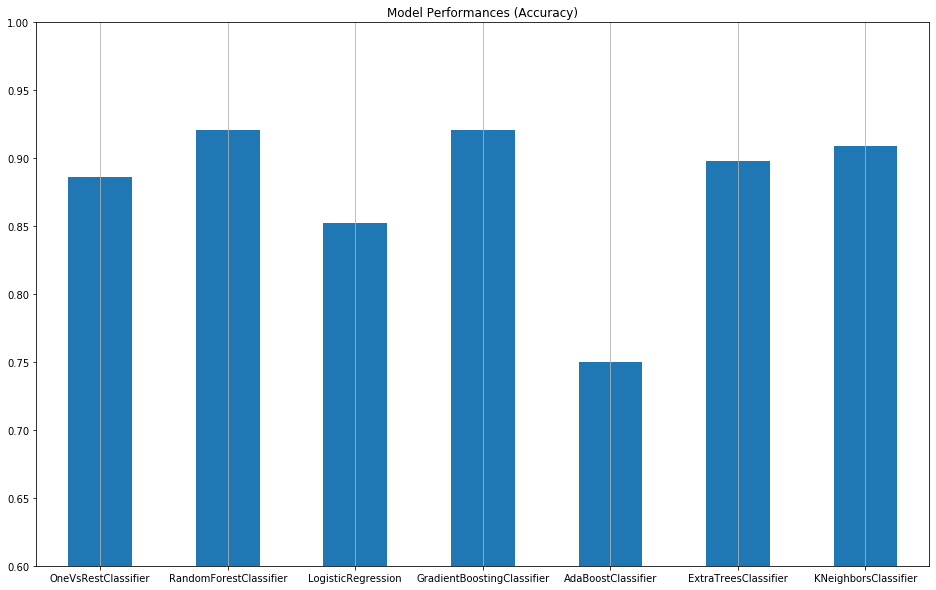

In [145]:
accuracy_vis = pd.DataFrame.from_dict(accuracy, orient='index')
fig, ax = plt.subplots(figsize=(16, 10))

accuracy_vis.plot.bar(rot=0, ax = ax)
ax.set_title('Model Performances (Accuracy)')
ax.get_legend().remove()
ax.grid(axis = 'x')
ax.set_ylim([0.6, 1.0])

We will now compare the results between the RandomForestClassifier and the GradientBoostingClassifier to determine which model is best suited and to rule out any overfitting.

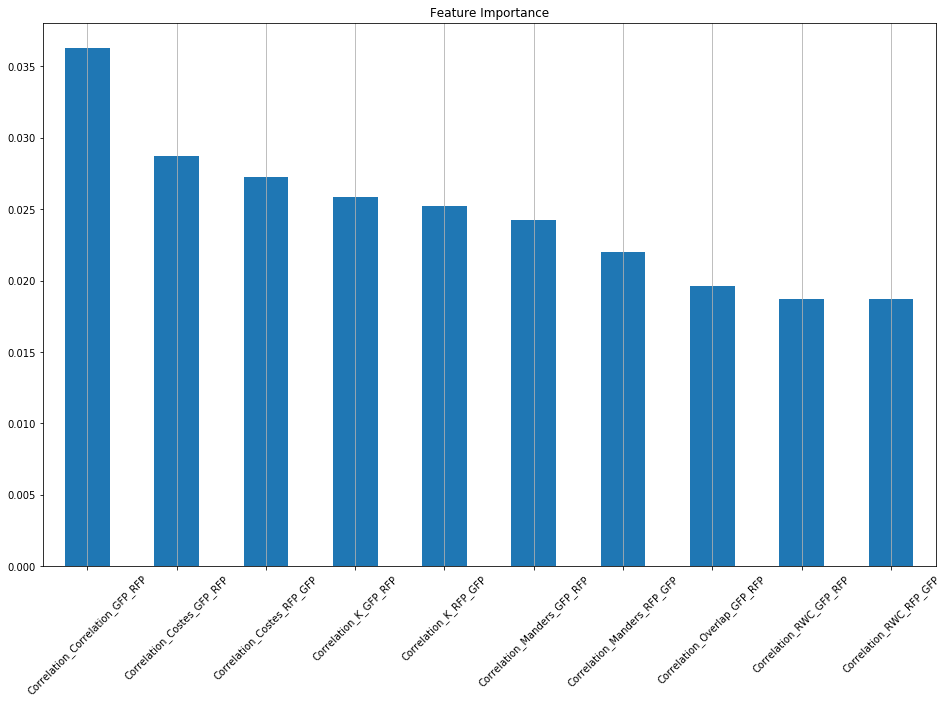

In [119]:
fig, ax = plt.subplots(figsize=(16, 10))

feature_importance = pd.DataFrame(rfc_final.feature_importances_, index = features.columns, 
                                  columns = ['Importance']).sort_values('Importance', ascending = False).head(10)

feature_importance.plot.bar(rot=0,ax=ax)
ax.set_title('Feature Importance')
ax.get_legend().remove()
ax.set_xticklabels(features.columns, rotation=45)
ax.grid(axis='x')

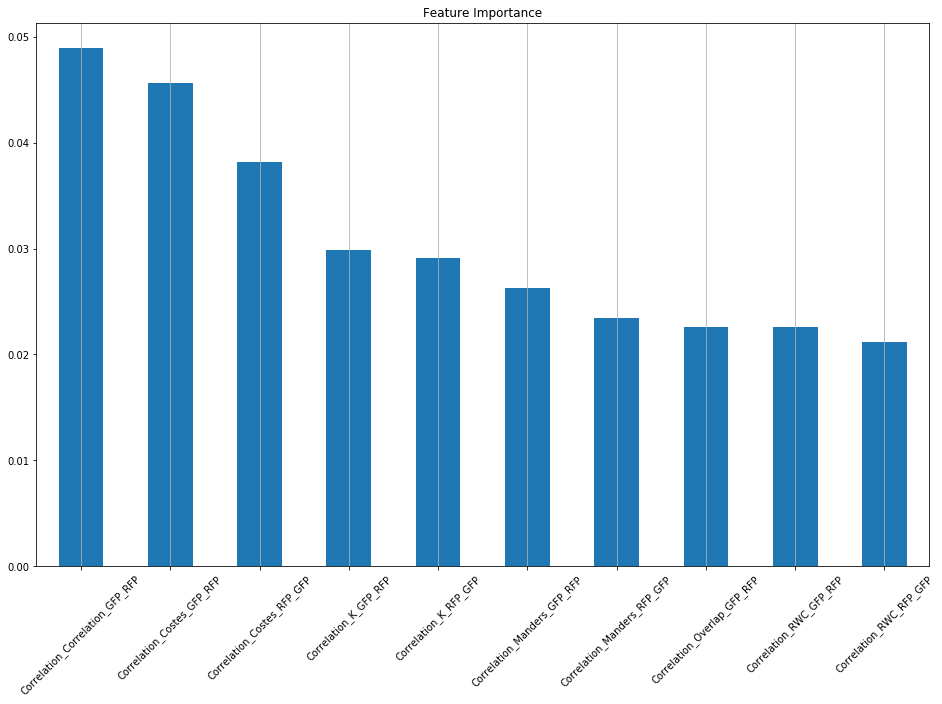

In [125]:
fig, ax = plt.subplots(figsize=(16, 10))

feature_importance = pd.DataFrame(gbc_final.feature_importances_, index = features.columns, 
                                  columns = ['Importance']).sort_values('Importance', ascending = False).head(10)

feature_importance.plot.bar(rot=0,ax=ax)
ax.set_title('Feature Importance')
ax.get_legend().remove()
ax.set_xticklabels(features.columns, rotation=45)
ax.grid(axis='x')

From the above graph, we can see the **10 most important features** in classifying our images.<br>

It seems like the top 10 features are exactly same for both `RandomForestClassifier` and for `GradientBoostingClassifier`.

To ensure that our models are not overfitting, we're going to test the models through `Mean Squared Error` and `cross_val_score` function from _sklearn_ library.

In [126]:
#RandomForestClassifier

from sklearn.metrics import mean_squared_error

y_train_predicted = rfc_final.predict(X_train)
y_test_predicted = rfc_final.predict(X_test)
mse_train = mean_squared_error(y_train, y_train_predicted)
mse_test = mean_squared_error(y_test, y_test_predicted)

print('Train MSE: {}, Test MSE: {}'.format(mse_train, mse_test))

Train MSE: 0.004878048780487805, Test MSE: 0.11363636363636363


Train MSE is 0.0049 whereas Test MSE is 0.1136 (Lower `Mean Squared Error` means better performance).<br>
Hence, it seems like the model is **overfitting** the training dataset.<br>  

In [146]:
#GradientBoostingClassifier

from sklearn.metrics import mean_squared_error

y_train_predicted2 = gbc_final.predict(X_train)
y_test_predicted2 = gbc_final.predict(X_test)
mse_train2 = mean_squared_error(y_train, y_train_predicted2)
mse_test2 = mean_squared_error(y_test, y_test_predicted2)

print('Train MSE: {}, Test MSE: {}'.format(mse_train2, mse_test2))

Train MSE: 0.0, Test MSE: 0.11363636363636363


Train MSE is 0.0 whereas Test MSE is 0.1136.
Train MSE is very suspicious of model **overfitting** the training dataset.<br>

_We will re-tune the model to prevent overfitting._ <br>  
Best hyperparameter values we had were:

In [148]:
rfc3.best_params_

{'randomforestclassifier__bootstrap': False,
 'randomforestclassifier__max_depth': 7,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 2,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 60}

In [151]:
gbc2.best_params_

{'gradientboostingclassifier__max_depth': 5,
 'gradientboostingclassifier__max_features': 5,
 'gradientboostingclassifier__min_samples_leaf': 2,
 'gradientboostingclassifier__min_samples_split': 2,
 'gradientboostingclassifier__n_estimators': 100}

**We will first re-tune the `RandomForestClassifier`.**

In [152]:
pipe_rfc = make_pipeline(RandomForestClassifier(random_state = 42, n_jobs=-1))

param_grid4 = [{    
    'randomforestclassifier__bootstrap': [True, False],
    'randomforestclassifier__criterion': ['gini', 'entropy'],
    'randomforestclassifier__max_depth': [6, 7, 8],
    'randomforestclassifier__max_features': [4, 5, 6],
    'randomforestclassifier__min_samples_leaf': [2, 3, 4],
    'randomforestclassifier__min_samples_split': [2, 3, 4],
    'randomforestclassifier__n_estimators': [50, 55, 60, 65, 70]
    
}]

rfc4 = grid_search_fit(pipe_rfc, param_grid4)

preds4 = rfc4.predict(X_test)
print(classification_report(y_test, preds4, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 1620 candidates, totalling 8100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    9.6s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   19.8s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.8s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.5s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.2s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 4026 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 4584 tasks      | e

              precision    recall  f1-score   support

       empty       1.00      0.94      0.97        18
        good       0.91      0.94      0.92        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.93        88
   macro avg       0.94      0.93      0.94        88
weighted avg       0.93      0.93      0.93        88



In [153]:
rfc4.best_params_

{'randomforestclassifier__bootstrap': False,
 'randomforestclassifier__criterion': 'entropy',
 'randomforestclassifier__max_depth': 8,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 4,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 60}

In [154]:
pipe_rfc = make_pipeline(RandomForestClassifier(random_state = 42, n_jobs=-1))

param_grid5 = [{    
    'randomforestclassifier__bootstrap': [False],
    'randomforestclassifier__criterion': ['entropy'],
    'randomforestclassifier__max_depth': [7, 8, 9, 10],
    'randomforestclassifier__max_features': [4, 5, 6],
    'randomforestclassifier__min_samples_leaf': [3, 4, 5, 6],
    'randomforestclassifier__min_samples_split': [2, 3, 4],
    'randomforestclassifier__n_estimators': [50, 55, 60, 65, 70]
    
}]

rfc5 = grid_search_fit(pipe_rfc, param_grid5)

preds5 = rfc5.predict(X_test)
print(classification_report(y_test, preds5, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   17.8s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.4s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   40.5s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   50.0s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished


              precision    recall  f1-score   support

       empty       1.00      0.94      0.97        18
        good       0.91      0.94      0.92        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.93        88
   macro avg       0.94      0.93      0.94        88
weighted avg       0.93      0.93      0.93        88



In [155]:
rfc5.best_params_

{'randomforestclassifier__bootstrap': False,
 'randomforestclassifier__criterion': 'entropy',
 'randomforestclassifier__max_depth': 8,
 'randomforestclassifier__max_features': 5,
 'randomforestclassifier__min_samples_leaf': 4,
 'randomforestclassifier__min_samples_split': 2,
 'randomforestclassifier__n_estimators': 60}

It seems like our model is now fine-tuned.<br>  
Major change we is made from our previous `RandomForestClassifier` model - `criterion` is changed from **gini** to **entropy**.<br>  
Let's see if our **MSE scores** improve.

In [156]:
y_train_predicted = rfc5.predict(X_train)
y_test_predicted = rfc5.predict(X_test)
mse_train = mean_squared_error(y_train, y_train_predicted)
mse_test = mean_squared_error(y_test, y_test_predicted)

print('Train MSE: {}, Test MSE: {}'.format(mse_train, mse_test))

Train MSE: 0.01951219512195122, Test MSE: 0.10227272727272728


**Train MSE** is still smaller than our **Test MSE**, but the numbers seem more reasonable compared to our previous result.<br>  
This time we will run `cross_val_score` function from *sklearn* library with **5 folds** & `Accuracy` scores.

In [157]:
from sklearn.model_selection import cross_val_score

scores_train = cross_val_score(rfc5, X_train, y_train, cv=5)
scores_test = cross_val_score(rfc5, X_test, y_test, cv=5)

print('Train Accuracy: %0.3f' % (scores_train.mean()))
print('Test Accuracy: %0.3f' % (scores_test.mean()))

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.6s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.4s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.1s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   17.6s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.3s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   50.2s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.0s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.4s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.3s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.0s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.7s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.5s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   50.9s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.4s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.0s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.1s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.1s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.1s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.3s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min


Train Accuracy: 0.898
Test Accuracy: 0.877


[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params)


Accuracy scores indicate that our model may not be overfitting afterall. However, since our dataset was not perfectly balanced, we will test out the `cross_val_score` function again with `precision_weighted`.

In [158]:
scores_train = cross_val_score(rfc5, X_train, y_train, cv=5, scoring = 'precision_weighted')
scores_test = cross_val_score(rfc5, X_test, y_test, cv=5, scoring = 'precision_weighted')

print('Train Precision: %0.3f' % (scores_train.mean()))
print('Test Precision: %0.3f' % (scores_test.mean()))

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    7.5s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:   11.1s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   21.3s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   27.9s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   35.8s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   55.7s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.1s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.9s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.7s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.5s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.7s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   53.6s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   45.5s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   55.6s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.6s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.5s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.6s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.9s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   53.2s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.6s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.6s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.7s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.2s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.8s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.7s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.4s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   33.3s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   42.2s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   52.0s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-pac

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.3s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.9s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.8s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.7min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was p

Fitting 5 folds for each of 720 candidates, totalling 3600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   12.5s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   25.0s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   41.7s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.7s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 3504 tasks      | elapsed:  1.7min


Train Precision: 0.906
Test Precision: 0.893


[Parallel(n_jobs=-1)]: Done 3600 out of 3600 | elapsed:  1.8min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\pipeline.py:356: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params)


It looks like our model is now fine-tuned and reasonably not overfitting the dataset.<br>  
Both accuracy scores and the precision scores support that our model is not overfitting.<br>  
We'll finalize the model and proceed to re-check the `
feature_importances_`.

In [159]:
rfc_final = RandomForestClassifier(random_state = 42, criterion = 'entropy', n_jobs = -1, bootstrap = False, max_depth = 8,
                                                max_features = 5, min_samples_leaf = 4, min_samples_split = 2,
                                                 n_estimators = 60)

rfc_final.fit(X_train, np.ravel(y_train))
pred_final = rfc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       1.00      0.94      0.97        18
        good       0.91      0.94      0.92        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.93        88
   macro avg       0.94      0.93      0.94        88
weighted avg       0.93      0.93      0.93        88



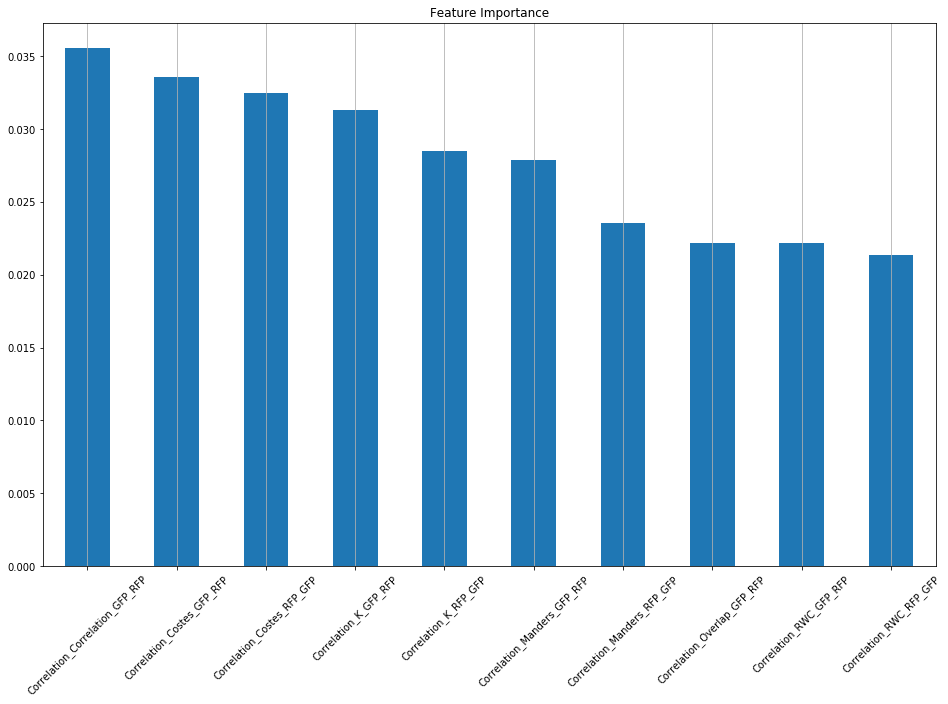

In [160]:
fig, ax = plt.subplots(figsize=(16, 10))

feature_importance = pd.DataFrame(rfc_final.feature_importances_, index = features.columns, 
                                  columns = ['Importance']).sort_values('Importance', ascending = False).head(10)

feature_importance.plot.bar(rot=0,ax=ax)
ax.set_title('Feature Importance')
ax.get_legend().remove()
ax.set_xticklabels(features.columns, rotation=45)
ax.grid(axis='x')

There is no significant changes made to our `feature_importances_` graph.<br>  
Hence, we can conclude that these are our **top 10 features** that have the most impact to our model.

**Now we will re-tune the `GradientBoostingClassifier`.**

In [165]:
pipe_gbc = make_pipeline(GradientBoostingClassifier(random_state = 42))

param_grid = [{
    'gradientboostingclassifier__n_estimators': [50, 100, 150],
    'gradientboostingclassifier__max_depth': [4, 5, 6],
    'gradientboostingclassifier__max_features': [4, 5, 6],
    'gradientboostingclassifier__min_samples_leaf': [2, 3],
    'gradientboostingclassifier__min_samples_split': [2, 3],
    'gradientboostingclassifier__criterion': ['friedman_mse', 'mse'],
    'gradientboostingclassifier__min_impurity_decrease':[0, 1, 2]
}]

gbc3 = grid_search_fit(pipe_gbc, param_grid)

preds3 = gbc3.predict(X_test)
print(classification_report(y_test, preds3, target_names = ['empty', 'good', 'blurred']))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   27.0s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   38.6s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   48.6s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   59.8s


              precision    recall  f1-score   support

       empty       0.94      0.94      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.92        88
   macro avg       0.92      0.92      0.92        88
weighted avg       0.92      0.92      0.92        88



[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.1min finished


In [166]:
gbc3.best_params_

{'gradientboostingclassifier__criterion': 'friedman_mse',
 'gradientboostingclassifier__max_depth': 5,
 'gradientboostingclassifier__max_features': 5,
 'gradientboostingclassifier__min_impurity_decrease': 0,
 'gradientboostingclassifier__min_samples_leaf': 2,
 'gradientboostingclassifier__min_samples_split': 2,
 'gradientboostingclassifier__n_estimators': 100}

It seems like we're already at the optimum with no further parameters to be tuned.

In [167]:
y_train_predicted = gbc3.predict(X_train)
y_test_predicted = gbc3.predict(X_test)
mse_train = mean_squared_error(y_train, y_train_predicted)
mse_test = mean_squared_error(y_test, y_test_predicted)

print('Train MSE: {}, Test MSE: {}'.format(mse_train, mse_test))

Train MSE: 0.0, Test MSE: 0.11363636363636363


In [168]:
scores_train_gbc = cross_val_score(gbc3, X_train, y_train, cv=5)
scores_test_gbc = cross_val_score(gbc3, X_test, y_test, cv=5)

print('Train Accuracy: %0.3f' % (scores_train_gbc.mean()))
print('Test Accuracy: %0.3f' % (scores_test_gbc.mean()))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   15.2s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   19.7s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   25.9s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   39.3s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:   45.8s
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:   53.8s
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.1min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversio

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.4s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   23.6s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   32.7s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   54.4s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.0min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.8s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   22.3s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   31.4s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   41.2s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   54.0s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.0min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    9.8s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   32.5s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   54.8s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.0min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.1s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    9.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   15.4s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   22.7s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   42.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   54.1s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.0min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   33.7s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   51.1s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent worker

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   12.3s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   18.1s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   25.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   42.8s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   49.5s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.4s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   13.2s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   26.2s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   42.9s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   48.7s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    8.1s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   20.0s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   35.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   45.0s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   50.9s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   19.1s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   27.1s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   35.0s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   43.9s


Train Accuracy: 0.937
Test Accuracy: 0.888


[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   49.7s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [169]:
scores_train_gbc = cross_val_score(gbc3, X_train, y_train, cv=5, scoring = 'precision_weighted')
scores_test_gbc = cross_val_score(gbc3, X_test, y_test, cv=5, scoring = 'precision_weighted')

print('Train Precision: %0.3f' % (scores_train_gbc.mean()))
print('Test Precision: %0.3f' % (scores_test_gbc.mean()))

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 tasks      | elapsed:    7.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    9.3s
[Parallel(n_jobs=-1)]: Done 264 tasks      | elapsed:   13.4s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:   17.7s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:   23.0s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 1128 tasks      | elapsed:   37.3s
[Parallel(n_jobs=-1)]: Done 1434 tasks      | elapsed:   44.3s
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed:   51.7s
[Parallel(n_jobs=-1)]: Done 2154 tasks      | elapsed:   59.3s
[Parallel(n_jobs=-1)]: Done 2568 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3018 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.4min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversio

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.8s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   11.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   18.2s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   25.8s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   59.6s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.2min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent worker

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   12.0s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   19.2s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   38.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   49.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.2min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   35.6s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 2724 tasks      | elapsed:   59.1s
[Parallel(n_jobs=-1)]: Done 3066 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.2min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:   11.9s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   26.9s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   37.5s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   47.7s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   59.4s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.1min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.4s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   12.6s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   27.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   36.1s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   46.1s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   52.6s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent worker

Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   20.3s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   39.8s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   50.1s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   57.5s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   14.2s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   21.5s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   30.4s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   41.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   52.3s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   59.3s finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   13.9s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   30.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   53.9s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.0min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Done  72 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 252 tasks      | elapsed:    5.3s
[Parallel(n_jobs=-1)]: Done 504 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 1224 tasks      | elapsed:   23.5s
[Parallel(n_jobs=-1)]: Done 1692 tasks      | elapsed:   34.3s
[Parallel(n_jobs=-1)]: Done 2232 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 2844 tasks      | elapsed:   56.8s


Train Precision: 0.942
Test Precision: 0.895


[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:  1.1min finished
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\ensemble\gradient_boosting.py:1450: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [170]:
gbc_final = GradientBoostingClassifier(random_state=42, max_depth = 5,
                                                    max_features = 5, min_samples_leaf = 2,
                                                    min_samples_split = 2, n_estimators = 100)

gbc_final.fit(X_train, np.ravel(y_train))
pred_final = gbc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       0.94      0.94      0.94        18
        good       0.90      0.90      0.90        31
     blurred       0.92      0.92      0.92        39

    accuracy                           0.92        88
   macro avg       0.92      0.92      0.92        88
weighted avg       0.92      0.92      0.92        88



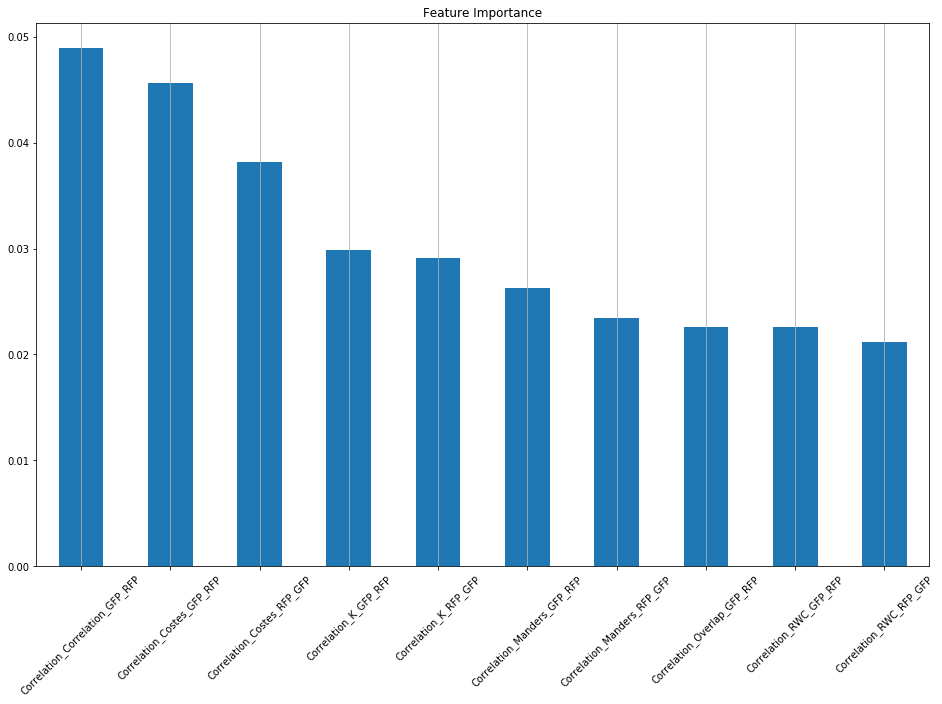

In [171]:
fig, ax = plt.subplots(figsize=(16, 10))

feature_importance = pd.DataFrame(gbc_final.feature_importances_, index = features.columns, 
                                  columns = ['Importance']).sort_values('Importance', ascending = False).head(10)

feature_importance.plot.bar(rot=0,ax=ax)
ax.set_title('Feature Importance')
ax.get_legend().remove()
ax.set_xticklabels(features.columns, rotation=45)
ax.grid(axis='x')

Both models seem to be performing at a similar level of accuracy and precision. However, `GradientBoostingClassifier` has higher Training Accuracy and Precision - indicating that the model might be overfitting the training data more so than the `RandomForestClassifier`. <br><br> **Hence, it seems like `RandomForestClassifier` would be our optimal model for classifying the microscope images.**

### Model Evaluation - Restored Dataset  3.9

We restored all of our *blurred images* and extracted the features again to compile a **restored_features** dataset.<br>  
We are going to prepare the dataset using the same steps as above and try to see what results we can get with our finalized `RandomForestClassifier` model.

In [172]:
restored_df = pd.read_csv('restored_features.csv')

In [173]:
restored_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Columns: 150 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(6), object(1)
memory usage: 150.1+ KB


In [174]:
restored_df = restored_df[restored_df.columns.intersection(df.columns)]
restored_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 128 entries, 0 to 127
Columns: 148 entries, Correlation_Correlation_GFP_RFP to Label
dtypes: float64(143), int64(4), object(1)
memory usage: 148.1+ KB


In [175]:
restored_df['Label'].unique()

array(['good'], dtype=object)

In [176]:
restored_df['Label'] = restored_df['Label'].map({'good':1})

In [177]:
restored_df['Label'].value_counts()

1    128
Name: Label, dtype: int64

In [178]:
restored_df.isnull().values.any()

False

Since we are certain that there are no missing values and that all `Label`s are *good* **or** *1*,<br>
we are going to split the dataset using `train_test_split` function again.

In [179]:
restored_features = restored_df.loc[:, restored_df.columns != 'Label'].astype(float)
restored_target = restored_df.loc[:, restored_df.columns == 'Label']

X_train, X_test, y_train, y_test = train_test_split(restored_features, restored_target, 
                                                    test_size = 0.3, random_state = 42, stratify = restored_target)

In [180]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(89, 147)
(39, 147)
(89, 1)
(39, 1)


We will standardize the dataset with `StandardScaler`

In [181]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

Now we will test our finalized model with our new dataset containing **restored blurred images**.

In [182]:
pred_final = rfc_final.predict(X_test)

print(classification_report(y_test, pred_final, target_names = ['empty', 'good', 'blurred']))

              precision    recall  f1-score   support

       empty       0.00      0.00      0.00         0
        good       1.00      0.18      0.30        39
     blurred       0.00      0.00      0.00         0

    accuracy                           0.18        39
   macro avg       0.33      0.06      0.10        39
weighted avg       1.00      0.18      0.30        39



Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\metrics\classification.py:1439: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples.
  'recall', 'true', average, warn_for)


As expected, our model was able to achieve 100% precision.

In [183]:
scores_train = cross_val_score(rfc_final, X_train, y_train, cv=3)
scores_test = cross_val_score(rfc_final, X_test, y_test, cv=3)

print('Train Accuracy: %0.3f' % (scores_train.mean()))
print('Test Accuracy: %0.3f' % (scores_test.mean()))

Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:514: DataConversionWarning: A column-vector y wa

Train Accuracy: 1.000
Test Accuracy: 1.000


Z:\ProgramFiles\Anaconda\lib\site-packages\sklearn\model_selection\_validation.py:514: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)


Again, as expected, our model also achieved 100% accuracy in both train set and the test set since all `Label`s are `good`.

***